In [ ]:
# import the required packages

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Table of Content

>[Task 1: Supervised Learning Using Airbnb Dataset](#scrollTo=v_TcxXyE7H_U)

>>[1.1 Load and Explore the data](#scrollTo=A--E5-QW7H_W)

>>[1.2 Cleanse and Transform the data](#scrollTo=kvRdt4_z7H_b)

>>>[Dropping Columns](#scrollTo=qVdm5_dvqiBn)

>>>[Fill missing values](#scrollTo=sk4LwoU87z3W)

>>>[Filter Minimum Nights](#scrollTo=rLPlo-iU3Zgy)

>>>[Correlation Analysis](#scrollTo=eN4fxhT_Cs-i)

>>>[Log Transformation of Target Price](#scrollTo=E2Cb5ZEL-Vvw)

>>>[One Hot Encoding](#scrollTo=EeNx_BUypuUK)

>>>[Define Targets](#scrollTo=M4_Folcm3Nvl)

>>>[Train Test Split](#scrollTo=TBR-6Xvzp-N9)

>>>[Remove Outliers](#scrollTo=-7_B2l0HqMpF)

>>>[Scaling (Numeric features)](#scrollTo=JCVfGUvVqWo7)

>>[1.3 Build the Machine Learning Models](#scrollTo=ASH2Ev3N7H_c)

>>>[Random Forest](#scrollTo=HLuhFPAULjyq)

>>>[Decision Tree](#scrollTo=awpGBkz3D8gC)

>>>[Linear Regression](#scrollTo=PafgpHZoLrc3)

>>>[Gradient Boosting](#scrollTo=xuH4658PN7Yc)

>>>[Support Vector Regressor](#scrollTo=VjMjDwlGXiDy)

>>>[XGBoost Regressor](#scrollTo=lCR0nK955srN)

>>[1.4 Evaluate and Improve the Model(s) Performance](#scrollTo=I3-RMdlS7H_c)

>>>[Voting Regressor Ensemble (With top 3 models)](#scrollTo=Q7czZJvXYnRu)

>>>[Stacking Regressor Ensemble (With top 3 models)](#scrollTo=tFZ9iXvTNLaM)

>>>[GridSearch on XGBoost](#scrollTo=p7jSV2A_NULC)

>>>[GridSearch on Random Forest](#scrollTo=9YmkoXZST3B9)

>>>[Voting Regressor with Tuned models](#scrollTo=gnqCJEnDb-R5)

>>>[Stacking Regressor with Tuned models](#scrollTo=MKElNVYlVsU7)

>>[1.5 Summarize the findings](#scrollTo=211iHLwbCiuB)

>[Task 2: Unsupervised learning Using HR Dataset](#scrollTo=dpQ6Joz07H_j)

>[2.1 Load and Explore the data](#scrollTo=yKC6WlqC7H_j)

>[2.2 Cleanse and Transform the data](#scrollTo=WAknKF4D7H_j)

>>>[Missing Values](#scrollTo=PWrCqmCw5EId)

>>>[Outliers](#scrollTo=SP6DQln65IRB)

>>>[Dropping Columns](#scrollTo=S0_b2lW15Mfg)

>>>[One-hot Encoding](#scrollTo=J7Zs1y67Ac1h)

>>>[Scaling](#scrollTo=-mZ_0kJ75PBL)

>[2.3 Build the Clustering Model](#scrollTo=B-NsR5IX7H_j)

>>[K-Means Clustering](#scrollTo=MpDRV-E02-6h)

>>>[Elbow Method and Silhouette Score (KMeans)](#scrollTo=2OA1FqZJ2g4S)

>>[Hierarchical Clustering](#scrollTo=8w6lCDT624FD)

>>>[Dendrogram](#scrollTo=00YiG8uX26U6)

>[2.4 Evaluate and Improve the Model(s) Performance](#scrollTo=P1mM2Cud7H_k)

>[2.5 Summarise and Interpret](#scrollTo=PPBv7yi57H_k)

>[Machine Learning Assignment Report](#scrollTo=bEKih_ZU7H_k)

>[Summary/Overview](#scrollTo=AkyuiBQeGlxg)

>[Task 1: Airbnb (Rental price prediction)](#scrollTo=-OI8QmebGtoH)

>>[Problem Understanding](#scrollTo=XUy9M45YGzh7)

>>[Approach](#scrollTo=Zi_S-w4qG2W3)

>>[Data Exploration](#scrollTo=jogXkJg5G5ME)

>>[Data Cleansing and Transformation](#scrollTo=M5AqI06AG6IA)

>>>[Dropping Columns](#scrollTo=PbjNgZoMG8hL)

>>>[Missing Values Imputation](#scrollTo=W1VOj7glG9UJ)

>>>[Filter](#scrollTo=WfOIAjb8G-mC)

>>>[Log Transformation](#scrollTo=MBDy5bxAHBJm)

>>>[One-Hot Encoding](#scrollTo=zoVr6NFZHCYl)

>>>[Train Test Split](#scrollTo=wKAmNXP1HDCg)

>>>[Remove Outliers](#scrollTo=Fyc6GjH4HDsT)

>>>[Scaling](#scrollTo=h71UwW3-HaJ4)

>>[Correlation Analysis](#scrollTo=VjOwhgLCHfxA)

>>[Modeling](#scrollTo=eB4mO5qHHghk)

>>>[Feature Importance](#scrollTo=ao8I4r4CIL5D)

>>[Improving model’s performance](#scrollTo=td1mJWWKI7gP)

>[Task 2: HR Analytics (Promotion prediction)](#scrollTo=5Lxuydk3Jhl2)

>>[Problem Understanding](#scrollTo=LXjzDLSjJocB)

>>[Data Exploration](#scrollTo=G0lkAs85JqGi)

>>[Data Preprocessing](#scrollTo=CbVnhXE8JyqY)

>>>[Missing Values](#scrollTo=kPIn9sMFKBqT)

>>>[Outliers](#scrollTo=tD7mDLoCKDwI)

>>>[Dropping Columns](#scrollTo=s4Or7m9UMqfU)

>>>[Encoding](#scrollTo=ZWIK3axjMsoU)

>>>[Scaling](#scrollTo=lWNT-TvWMuY7)

>>>[Principal Component Analysis (PCA)](#scrollTo=CA6F1skDMxAr)

>>[Building of Models](#scrollTo=mm9L677xKWty)

>>>[K-Means Clustering](#scrollTo=iL50WAL1Kf67)

>>>[K-Means Results](#scrollTo=PtBwB2dQKtom)

>>>[Hierarchical Clustering](#scrollTo=swHs8GieK9Qv)

>>>[Hierarchical Clusteting Results](#scrollTo=qBZAnFqXN3gz)

>[Summary and Further Improvements](#scrollTo=4OFDXrTnOB2-)

>>[Summary of Findings](#scrollTo=0vlXKz2IOEeM)

>>>[Task 1](#scrollTo=iiRT-7vAOGlg)

>>>[Task 2](#scrollTo=KPt0oiDQOJZv)

>>[Further Improvements](#scrollTo=b2x3ZUbPOPD3)

>>>[Task 1](#scrollTo=oX5blK9zORcY)

>>>[Task 2](#scrollTo=FXSEedt0OUp3)

>>[Reflection](#scrollTo=kvYMbdsDOYJc)

>>[Use of Generative AI / Learning Assistants](#scrollTo=I_MeIuZ-OaP0)



# 1. Task 1: Supervised Learning Using Airbnb Dataset

## 1.1 Load and Explore the data

In [ ]:
airbnb = pd.read_csv('/content/drive/My Drive/ML assg/listings.csv')
print(airbnb .head())

      id                                 name  host_id  host_name  \
0  49091    COZICOMFORT LONG TERM STAY ROOM 2   266763  Francesca   
1  50646      Pleasant Room along Bukit Timah   227796    Sujatha   
2  56334                          COZICOMFORT   266763  Francesca   
3  71609  Ensuite Room (Room 1 & 2) near EXPO   367042    Belinda   
4  71896      B&B  Room 1 near Airport & EXPO   367042    Belinda   

  neighbourhood_group neighbourhood  latitude  longitude     room_type  price  \
0        North Region     Woodlands   1.44255  103.79580  Private room     83   
1      Central Region   Bukit Timah   1.33235  103.78521  Private room     81   
2        North Region     Woodlands   1.44246  103.79667  Private room     69   
3         East Region      Tampines   1.34541  103.95712  Private room    206   
4         East Region      Tampines   1.34567  103.95963  Private room     94   

   minimum_nights  number_of_reviews last_review  reviews_per_month  \
0             180          

In [ ]:
print(airbnb.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [ ]:
print(airbnb.isna().sum())

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64


In [ ]:
print(airbnb.describe())

                 id       host_id     latitude    longitude         price  \
count  7.907000e+03  7.907000e+03  7907.000000  7907.000000   7907.000000   
mean   2.338862e+07  9.114481e+07     1.314192   103.848787    169.332996   
std    1.016416e+07  8.190910e+07     0.030577     0.043675    340.187599   
min    4.909100e+04  2.366600e+04     1.243870   103.646560      0.000000   
25%    1.582180e+07  2.305808e+07     1.295795   103.835825     65.000000   
50%    2.470627e+07  6.344891e+07     1.311030   103.849410    124.000000   
75%    3.234850e+07  1.553811e+08     1.322110   103.872535    199.000000   
max    3.811276e+07  2.885676e+08     1.454590   103.973420  10000.000000   

       minimum_nights  number_of_reviews  reviews_per_month  \
count     7907.000000        7907.000000        5149.000000   
mean        17.510054          12.807386           1.043669   
std         42.094616          29.707746           1.285851   
min          1.000000           0.000000           0.0

In [ ]:
for col in ['neighbourhood_group','neighbourhood','room_type']:
    print(col, airbnb[col].nunique())


neighbourhood_group 5
neighbourhood 43
room_type 3


In [ ]:
# How many rows × columns?
print("Shape:", airbnb.shape)



Shape: (7907, 16)


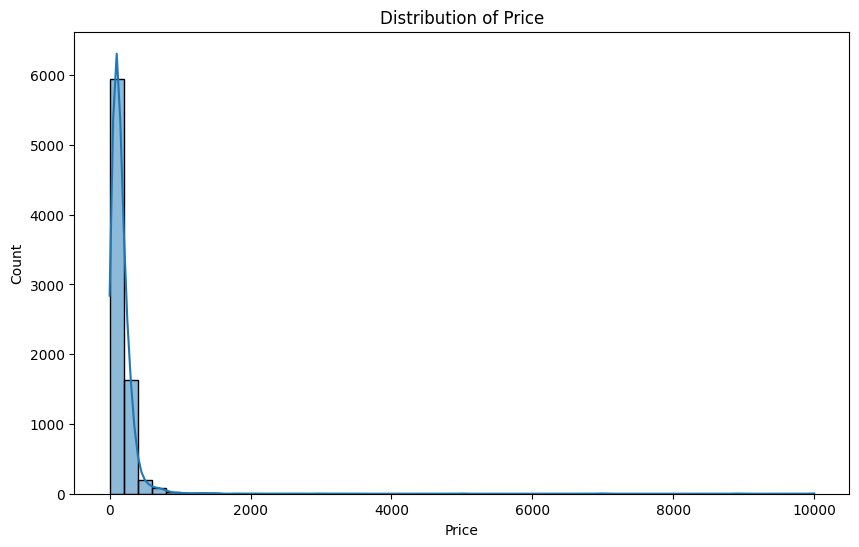

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot size and style
plt.figure(figsize=(10, 6))
sns.histplot(airbnb['price'], bins=50, kde=True)
plt.title("Distribution of Price")
plt.xlabel("Price")
plt.ylabel("Count")
plt.show()


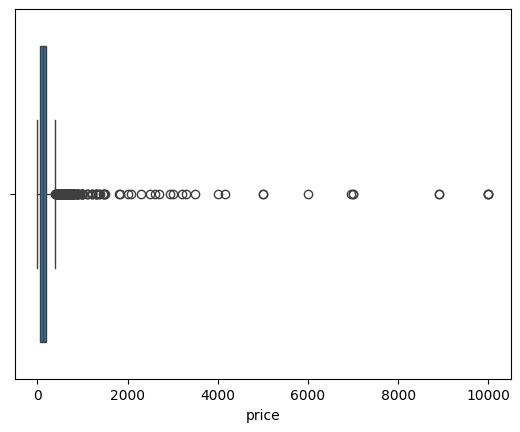

In [ ]:
sns.boxplot(x=airbnb['price'])
upper = airbnb['price'].quantile(0.99)
airbnb = airbnb[airbnb['price'] <= upper]


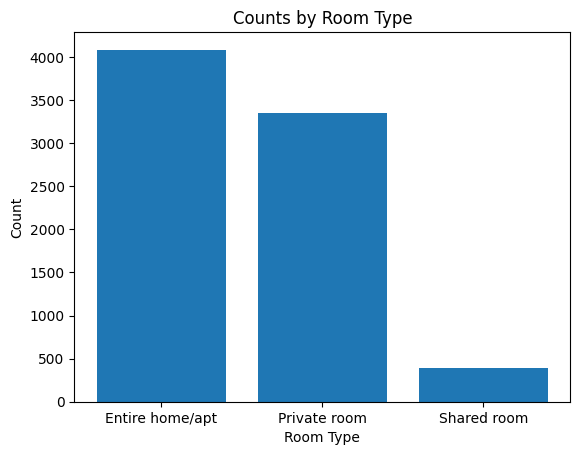

In [ ]:
counts = airbnb['room_type'].value_counts()
plt.figure()
plt.bar(counts.index, counts.values)
plt.title('Counts by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Count')
plt.show()

/tmp/ipython-input-2004964719.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(airbnb[col].dropna(), vert=False, labels=[col])
/tmp/ipython-input-2004964719.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(airbnb[col].dropna(), vert=False, labels=[col])
/tmp/ipython-input-2004964719.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(airbnb[col].dropna(), vert=False, labels=[col])
/tmp/ipython-input-2004964719.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be

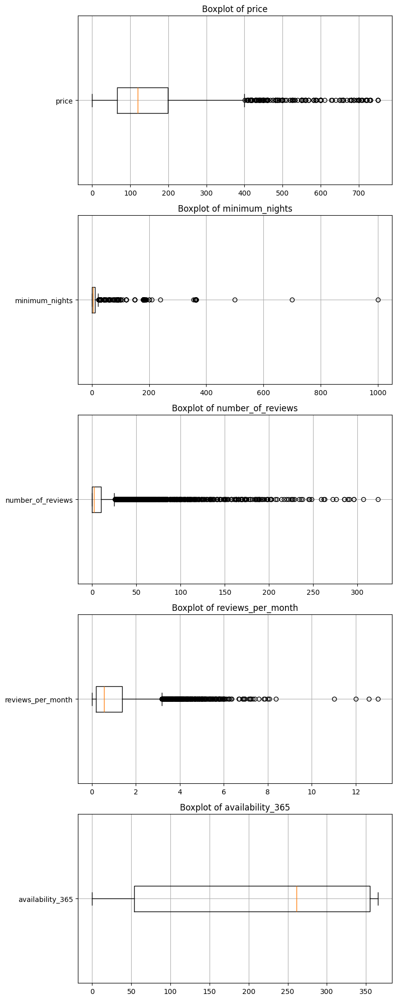

In [ ]:
# === Boxplots for selected numeric features ===
numeric_to_plot = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'availability_365']
fig, axes = plt.subplots(len(numeric_to_plot), 1, figsize=(8, 4 * len(numeric_to_plot)))

for i, col in enumerate(numeric_to_plot):
    axes[i].boxplot(airbnb[col].dropna(), vert=False, labels=[col])
    axes[i].set_title(f"Boxplot of {col}")
    axes[i].grid(True)

plt.tight_layout()
plt.show()


Checking if Last Review is worth keeping

In [ ]:
missing_pct = airbnb['last_review'].isna().mean() * 100
print(f"Missing last_review: {missing_pct:.1f}%")

Missing last_review: 34.5%


In [ ]:

import pandas as pd
# parse dates
airbnb['last_review'] = pd.to_datetime(airbnb['last_review'], errors='coerce')

# compute days since (NaN for missing)
today = pd.Timestamp('2025-07-30')
airbnb['days_since_review'] = (today - airbnb['last_review']).dt.days

# compute correlation (drop NaNs)
corr = airbnb[['days_since_review', 'price']].dropna().corr().loc['days_since_review', 'price']
print(f"Correlation between days_since_review and price: {corr:.2f}")
# Non‑inplace version
airbnb = airbnb.drop(columns=['days_since_review'])



Correlation between days_since_review and price: -0.10


In [ ]:
list(airbnb.columns)


['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [ ]:
# Numerical summaries
airbnb[['price','minimum_nights','number_of_reviews','reviews_per_month','availability_365']].describe()

# Categorical value counts
for col in ['neighbourhood_group','room_type']:
    print(f"\n{col} counts:")
    print(airbnb[col].value_counts())



neighbourhood_group counts:
neighbourhood_group
Central Region       6244
West Region           532
East Region           504
North-East Region     343
North Region          204
Name: count, dtype: int64

room_type counts:
room_type
Entire home/apt    4084
Private room       3352
Shared room         391
Name: count, dtype: int64


## 1.2 Cleanse and Transform the data

In [ ]:
airbnb = pd.read_csv('/content/drive/My Drive/ML assg/listings.csv')

### Dropping Columns

In [ ]:
cols_to_drop = ['id', 'name', 'last_review', 'host_name']
airbnb.drop(columns=cols_to_drop, inplace=True, errors='ignore')

Checking if it is dropped

In [ ]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         7907 non-null   int64  
 1   neighbourhood_group             7907 non-null   object 
 2   neighbourhood                   7907 non-null   object 
 3   latitude                        7907 non-null   float64
 4   longitude                       7907 non-null   float64
 5   room_type                       7907 non-null   object 
 6   price                           7907 non-null   int64  
 7   minimum_nights                  7907 non-null   int64  
 8   number_of_reviews               7907 non-null   int64  
 9   reviews_per_month               5149 non-null   float64
 10  calculated_host_listings_count  7907 non-null   int64  
 11  availability_365                7907 non-null   int64  
dtypes: float64(3), int64(6), object(3)

### Fill missing values

In [ ]:
airbnb['reviews_per_month'] = airbnb['reviews_per_month'].fillna(0)

### Filter Minimum Nights

In [ ]:
airbnb = airbnb[airbnb['minimum_nights'] <= 365]

### Correlation Analysis

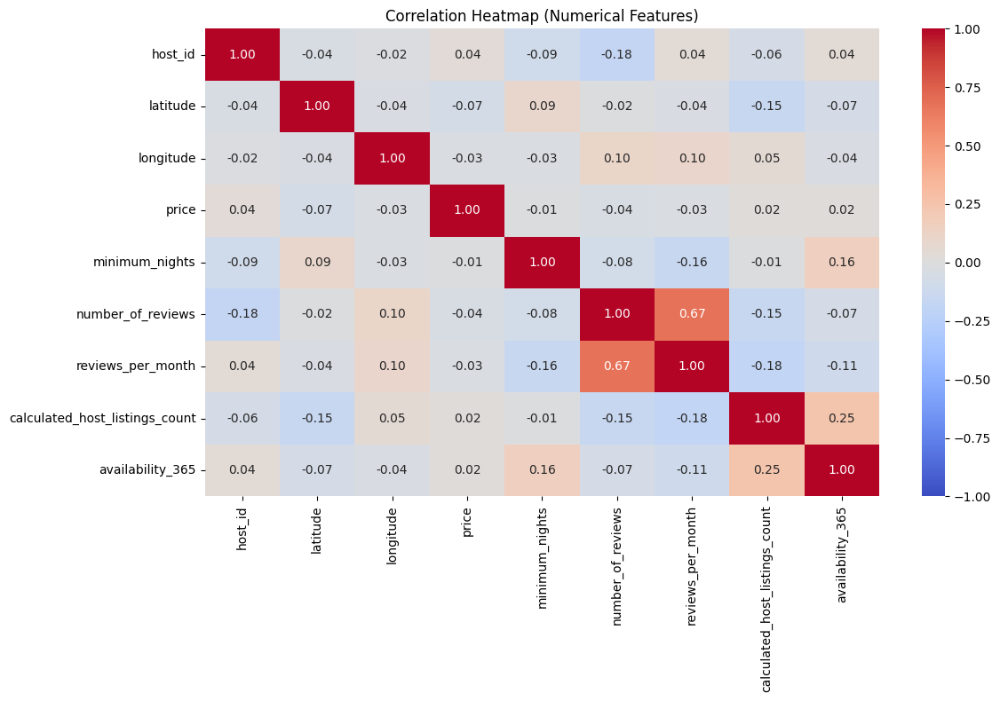

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Select only numerical features (including target)
numerical_cols = airbnb.select_dtypes(include=['int64', 'float64']).columns

# 2. Compute correlation matrix
corr_matrix = airbnb[numerical_cols].corr()

# 3. Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Heatmap (Numerical Features)")
plt.tight_layout()
plt.show()


### Log Transformation of Target Price

In [ ]:
airbnb['log_price'] = np.log1p(airbnb['price'])


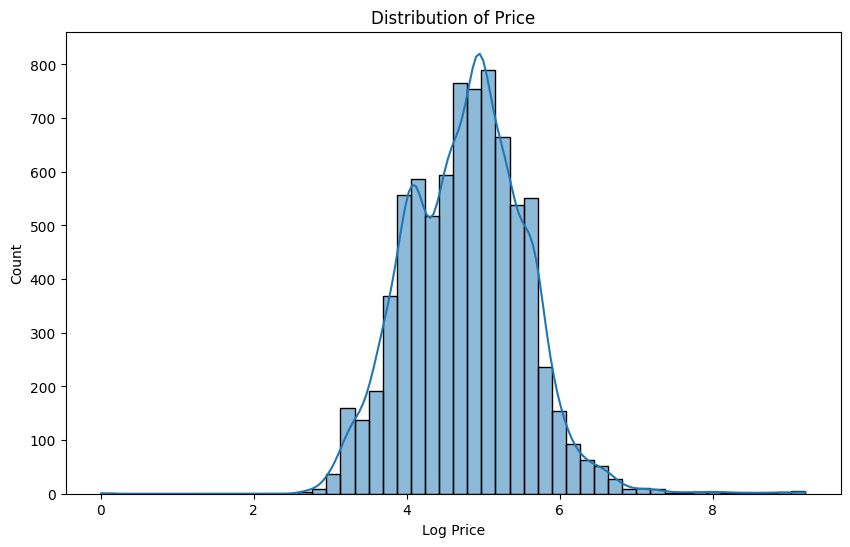

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot size and style
plt.figure(figsize=(10, 6))
sns.histplot(airbnb['log_price'], bins=50, kde=True)
plt.title("Distribution of Price")
plt.xlabel("Log Price")
plt.ylabel("Count")
plt.show()


### One Hot Encoding

In [ ]:
cat_cols = ['room_type', 'neighbourhood', 'neighbourhood_group']
df_encoded = pd.get_dummies(airbnb, columns=cat_cols, drop_first=True)

In [ ]:
print(airbnb.info())

<class 'pandas.core.frame.DataFrame'>
Index: 7827 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              7827 non-null   int64         
 1   name                            7825 non-null   object        
 2   host_id                         7827 non-null   int64         
 3   host_name                       7827 non-null   object        
 4   neighbourhood_group             7827 non-null   object        
 5   neighbourhood                   7827 non-null   object        
 6   latitude                        7827 non-null   float64       
 7   longitude                       7827 non-null   float64       
 8   room_type                       7827 non-null   object        
 9   price                           7827 non-null   int64         
 10  minimum_nights                  7827 non-null   int64         
 11  number_of

### Define Targets

In [ ]:
X_full = df_encoded.drop(columns=['price', 'log_price'], errors='ignore')
y_raw_full = df_encoded['price']              # raw price
y_full = np.log1p(y_raw_full)                 # log-transformed target

### Train Test Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X_full, y_full, test_size=0.2, random_state=42)

In [ ]:
# Derive raw targets from the log ones to keep alignment
y_train_raw = np.expm1(y_train)
y_test_raw = np.expm1(y_test)

### Remove Outliers

In [ ]:
lower, upper = y_train_raw.quantile([0.05, 0.95])
train_mask = (y_train_raw >= lower) & (y_train_raw <= upper)
test_mask = (y_test_raw >= lower) & (y_test_raw <= upper)

X train Y train

In [ ]:
X_train = X_train[train_mask]
y_train = y_train[train_mask]
y_train_raw = y_train_raw[train_mask]

X_test = X_test[test_mask]
y_test = y_test[test_mask]
y_test_raw = y_test_raw[test_mask]

### Scaling (Numeric features)

In [ ]:
from sklearn.preprocessing import QuantileTransformer

scaler = QuantileTransformer(output_distribution='normal', random_state=42)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


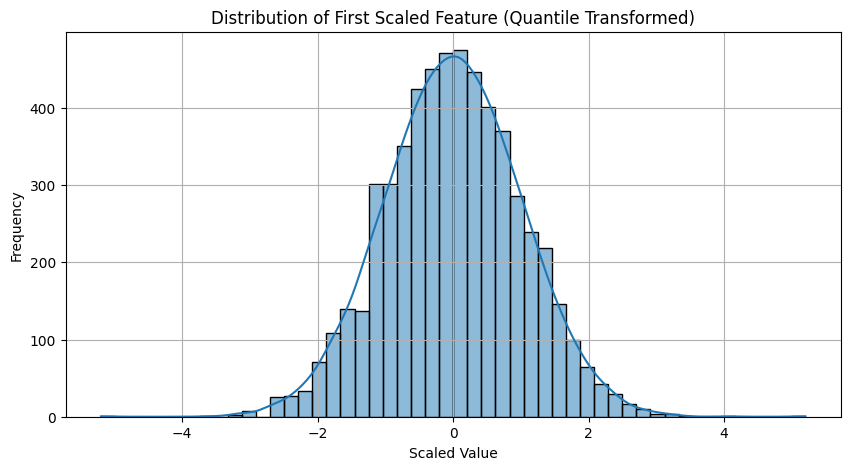

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.histplot(X_train_scaled[:, 0], bins=50, kde=True)
plt.title("Distribution of First Scaled Feature (Quantile Transformed)")
plt.xlabel("Scaled Value")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


In [ ]:
print(airbnb.isna().sum())

host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
log_price                         0
dtype: int64


In [ ]:
print(airbnb.describe())

            host_id     latitude    longitude         price  minimum_nights  \
count  7.904000e+03  7904.000000  7904.000000   7904.000000     7904.000000   
mean   9.115113e+07     1.314193   103.848789    169.331478       17.238360   
std    8.191572e+07     0.030580     0.043670    340.245151       39.522378   
min    2.366600e+04     1.243870   103.646560      0.000000        1.000000   
25%    2.305233e+07     1.295797   103.835830     65.000000        1.000000   
50%    6.344891e+07     1.311030   103.849410    124.000000        3.000000   
75%    1.553759e+08     1.322110   103.872523    199.000000       10.000000   
max    2.885676e+08     1.454590   103.973420  10000.000000      365.000000   

       number_of_reviews  reviews_per_month  calculated_host_listings_count  \
count        7904.000000        7904.000000                     7904.000000   
mean           12.810349           0.679832                       40.622470   
std            29.712786           1.150850        

## 1.3 Build the Machine Learning Models

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

rf_raw = RandomForestRegressor(random_state=42)
rf_raw.fit(X_train, y_train_raw)

y_train_pred_raw = rf_raw.predict(X_train)

mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)
print("Random Forest Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()


y_test_pred_raw = rf_raw.predict(X_test)

mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Random Forest Regressor

Train Performance (Raw Price)
MAE  = $12.33
RMSE = $17.65
R²    = 0.9531

Test Performance (Raw Price)
MAE  = $32.48
RMSE = $46.36
R²    = 0.6709


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

rf_log = RandomForestRegressor(random_state=42)
rf_log.fit(X_train, y_train)

y_train_pred_log = rf_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("Random Forest Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = rf_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


Random Forest Regressor

Train Performance (Log Price (converted back))
MAE  = $12.44
RMSE = $20.20
R²    = 0.9386

Test Performance (Log Price (converted back))
MAE  = $30.94
RMSE = $45.93
R²    = 0.6770


### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np


dt_raw = DecisionTreeRegressor(random_state=42)
dt_raw.fit(X_train, y_train_raw)

y_train_pred_raw = dt_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)
print("Decision Tree Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()

y_test_pred_raw = dt_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Decision Tree Regressor

Train Performance (Raw Price)
MAE  = $0.00
RMSE = $0.00
R²    = 1.0000

Test Performance (Raw Price)
MAE  = $39.22
RMSE = $61.43
R²    = 0.4222


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# 🔹 Train on log(price)
dt_log = DecisionTreeRegressor(random_state=42)
dt_log.fit(X_train, y_train)

y_train_pred_log = dt_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("Decision Tree Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = dt_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


Decision Tree Regressor

Train Performance (Log Price (converted back))
MAE  = $0.00
RMSE = $0.00
R²    = 1.0000

Test Performance (Log Price (converted back))
MAE  = $40.55
RMSE = $64.13
R²    = 0.3703


### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

lr_raw = LinearRegression()
lr_raw.fit(X_train, y_train_raw)

y_train_pred_raw = lr_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = lr_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)
print("Linear Regression\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price))")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")

Linear Regression

Train Performance (Raw Price)
MAE  = $47.13
RMSE = $61.24
R²    = 0.4358

Test Performance (Raw Price))
MAE  = $46.33
RMSE = $59.33
R²    = 0.4611


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

y_train_log = np.log1p(y_train_raw)
y_test_log = np.log1p(y_test_raw)

lr_log = LinearRegression()
lr_log.fit(X_train, y_train_log)

y_train_pred_log = lr_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)

y_test_pred_log = lr_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Linear Regression — Log Price (converted back)\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()
print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


Linear Regression — Log Price (converted back)

Train Performance (Log Price (converted back))
MAE  = $45.32
RMSE = $62.55
R²    = 0.4116

Test Performance (Log Price (converted back))
MAE  = $44.52
RMSE = $61.44
R²    = 0.4220


### Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

gb_raw = GradientBoostingRegressor(random_state=42)
gb_raw.fit(X_train, y_train_raw)

y_train_pred_raw = gb_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = gb_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)
print("Gradient Boosting Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price))")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Gradient Boosting Regressor

Train Performance (Raw Price)
MAE  = $39.13
RMSE = $51.76
R²    = 0.5970

Test Performance (Raw Price))
MAE  = $39.86
RMSE = $52.87
R²    = 0.5720


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

gb_log = GradientBoostingRegressor(random_state=42)
gb_log.fit(X_train, y_train)

y_train_pred_log = gb_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("Gradient Boosting Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = gb_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


Gradient Boosting Regressor

Train Performance (Log Price (converted back))
MAE  = $38.20
RMSE = $54.17
R²    = 0.5586

Test Performance (Log Price (converted back))
MAE  = $38.14
RMSE = $53.83
R²    = 0.5564


### Support Vector Regressor

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

svr_raw = SVR()
svr_raw.fit(X_train, y_train_raw)

y_train_pred_raw = svr_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = svr_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)
print("Support Vector Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Support Vector Regressor

Train Performance (Raw Price)
MAE  = $63.73
RMSE = $82.29
R²    = -0.0185

Test Performance (Raw Price)
MAE  = $62.40
RMSE = $80.54
R²    = 0.0069


In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

svr_log = SVR()
svr_log.fit(X_train, y_train)

y_train_pred_log = svr_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("Support Vector Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = svr_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


Support Vector Regressor

Train Performance (Log Price (converted back))
MAE  = $63.33
RMSE = $82.28
R²    = -0.0182

Test Performance (Log Price (converted back))
MAE  = $62.05
RMSE = $80.23
R²    = 0.0146


### XGBoost Regressor

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

xgb_raw = XGBRegressor(random_state=42, n_jobs=-1)
xgb_raw.fit(X_train, y_train_raw)

# Predict on training set
y_train_pred_raw = xgb_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

# Predict on test set
y_test_pred_raw = xgb_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)
print("XGBoost Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


XGBoost Regressor

Train Performance (Raw Price)
MAE  = $16.34
RMSE = $22.81
R²    = 0.9217

Test Performance (Raw Price)
MAE  = $34.07
RMSE = $48.30
R²    = 0.6428


In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

xgb_log = XGBRegressor(random_state=42, n_jobs=-1)
xgb_log.fit(X_train, y_train)

y_train_pred_log = xgb_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)  # back to raw price

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("XGBoost Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = xgb_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


XGBoost Regressor

Train Performance (Log Price (converted back))
MAE  = $17.54
RMSE = $27.12
R²    = 0.8893

Test Performance (Log Price (converted back))
MAE  = $32.30
RMSE = $47.27
R²    = 0.6579


### AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

ada_raw = AdaBoostRegressor(random_state=42)
ada_raw.fit(X_train, y_train_raw)

y_train_pred_raw = ada_raw.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = ada_raw.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)
print("AdaBoost Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


AdaBoost Regressor

Train Performance (Raw Price)
MAE  = $56.76
RMSE = $66.35
R²    = 0.3379

Test Performance (Raw Price)
MAE  = $56.83
RMSE = $66.71
R²    = 0.3187


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

ada_log = AdaBoostRegressor(random_state=42)
ada_log.fit(X_train, y_train)

y_train_pred_log = ada_log.predict(X_train)
y_train_pred_converted = np.expm1(y_train_pred_log)

mae_train_log = mean_absolute_error(y_train_raw, y_train_pred_converted)
rmse_train_log = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_converted))
r2_train_log = r2_score(y_train_raw, y_train_pred_converted)
print("AdaBoost Regressor\n")
print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train_log:.2f}")
print(f"RMSE = ${rmse_train_log:.2f}")
print(f"R²    = {r2_train_log:.4f}")
print()

y_test_pred_log = ada_log.predict(X_test)
y_test_pred_converted = np.expm1(y_test_pred_log)

mae_test_log = mean_absolute_error(y_test_raw, y_test_pred_converted)
rmse_test_log = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_converted))
r2_test_log = r2_score(y_test_raw, y_test_pred_converted)

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test_log:.2f}")
print(f"RMSE = ${rmse_test_log:.2f}")
print(f"R²    = {r2_test_log:.4f}")


AdaBoost Regressor

Train Performance (Log Price (converted back))
MAE  = $47.68
RMSE = $62.76
R²    = 0.4076

Test Performance (Log Price (converted back))
MAE  = $46.76
RMSE = $60.71
R²    = 0.4358


### Results

In [ ]:
import pandas as pd

# Build long-form rows from the reported results
rows = [
    # Random Forest
    {"Model": "Random Forest Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 12.33, "RMSE": 17.65, "R²": 0.9531},
    {"Model": "Random Forest Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 32.48, "RMSE": 46.36, "R²": 0.6709},
    {"Model": "Random Forest Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 12.44, "RMSE": 20.20, "R²": 0.9386},
    {"Model": "Random Forest Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 30.94, "RMSE": 45.93, "R²": 0.6770},

    # Decision Tree
    {"Model": "Decision Tree Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 0.00, "RMSE": 0.00, "R²": 1.0000},
    {"Model": "Decision Tree Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 39.22, "RMSE": 61.43, "R²": 0.4222},
    {"Model": "Decision Tree Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 0.00, "RMSE": 0.00, "R²": 1.0000},
    {"Model": "Decision Tree Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 40.55, "RMSE": 64.13, "R²": 0.3703},

    # Linear Regression
    {"Model": "Linear Regression", "Target Scale": "Raw Price", "Split": "Train", "MAE": 47.13, "RMSE": 61.24, "R²": 0.4358},
    {"Model": "Linear Regression", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 46.33, "RMSE": 59.33, "R²": 0.4611},
    {"Model": "Linear Regression", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 45.32, "RMSE": 62.55, "R²": 0.4116},
    {"Model": "Linear Regression", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 44.52, "RMSE": 61.44, "R²": 0.4220},

    # Gradient Boosting
    {"Model": "Gradient Boosting Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 39.13, "RMSE": 51.76, "R²": 0.5970},
    {"Model": "Gradient Boosting Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 39.86, "RMSE": 52.87, "R²": 0.5720},
    {"Model": "Gradient Boosting Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 38.20, "RMSE": 54.17, "R²": 0.5586},
    {"Model": "Gradient Boosting Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 38.14, "RMSE": 53.83, "R²": 0.5564},

    # SVR
    {"Model": "Support Vector Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 63.73, "RMSE": 82.29, "R²": -0.0185},
    {"Model": "Support Vector Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 62.40, "RMSE": 80.54, "R²": 0.0069},
    {"Model": "Support Vector Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 63.33, "RMSE": 82.28, "R²": -0.0182},
    {"Model": "Support Vector Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 62.05, "RMSE": 80.23, "R²": 0.0146},

    # XGBoost
    {"Model": "XGBoost Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 16.34, "RMSE": 22.81, "R²": 0.9217},
    {"Model": "XGBoost Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 34.07, "RMSE": 48.30, "R²": 0.6428},
    {"Model": "XGBoost Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 17.54, "RMSE": 27.12, "R²": 0.8893},
    {"Model": "XGBoost Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 32.30, "RMSE": 47.27, "R²": 0.6579},

    # AdaBoost
    {"Model": "AdaBoost Regressor", "Target Scale": "Raw Price", "Split": "Train", "MAE": 56.76, "RMSE": 66.35, "R²": 0.3379},
    {"Model": "AdaBoost Regressor", "Target Scale": "Raw Price", "Split": "Test",  "MAE": 56.83, "RMSE": 66.71, "R²": 0.3187},
    {"Model": "AdaBoost Regressor", "Target Scale": "Log Price (converted back)", "Split": "Train", "MAE": 47.68, "RMSE": 62.76, "R²": 0.4076},
    {"Model": "AdaBoost Regressor", "Target Scale": "Log Price (converted back)", "Split": "Test",  "MAE": 46.76, "RMSE": 60.71, "R²": 0.4358},
]

df_long = pd.DataFrame(rows)

# Pivot to wide format with grouped metrics
mae = df_long.pivot(index=["Model", "Target Scale"], columns="Split", values="MAE")
rmse = df_long.pivot(index=["Model", "Target Scale"], columns="Split", values="RMSE")
r2 = df_long.pivot(index=["Model", "Target Scale"], columns="Split", values="R²")

wide = pd.DataFrame({
    "Model": [idx[0] for idx in mae.index],
    "Target Scale": [idx[1] for idx in mae.index],
    "MAE Train": mae["Train"].values,
    "MAE Test": mae["Test"].values,
    "RMSE Train": rmse["Train"].values,
    "RMSE Test": rmse["Test"].values,
    "R² Train": r2["Train"].values,
    "R² Test": r2["Test"].values,
})

# Optional: enforce a specific ordering if desired
model_order = [
    "Random Forest Regressor",
    "Decision Tree Regressor",
    "Linear Regression",
    "Gradient Boosting Regressor",
    "Support Vector Regressor",
    "XGBoost Regressor",
    "AdaBoost Regressor",
]
wide["Model"] = pd.Categorical(wide["Model"], categories=model_order, ordered=True)
wide = wide.sort_values(by=["Model", "Target Scale"]).reset_index(drop=True)

# Display as markdown-style table
print(wide.to_markdown(index=False))

# Save to CSV if needed
wide.to_csv("model_performance_summary.csv", index=False)


| Model                       | Target Scale               |   MAE Train |   MAE Test |   RMSE Train |   RMSE Test |   R² Train |   R² Test |
|:----------------------------|:---------------------------|------------:|-----------:|-------------:|------------:|-----------:|----------:|
| Random Forest Regressor     | Log Price (converted back) |       12.44 |      30.94 |        20.2  |       45.93 |     0.9386 |    0.677  |
| Random Forest Regressor     | Raw Price                  |       12.33 |      32.48 |        17.65 |       46.36 |     0.9531 |    0.6709 |
| Decision Tree Regressor     | Log Price (converted back) |        0    |      40.55 |         0    |       64.13 |     1      |    0.3703 |
| Decision Tree Regressor     | Raw Price                  |        0    |      39.22 |         0    |       61.43 |     1      |    0.4222 |
| Linear Regression           | Log Price (converted back) |       45.32 |      44.52 |        62.55 |       61.44 |     0.4116 |    0.422  |
| Line

Comparing Feature Importance with Best baseline model

In [ ]:
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics   import mean_squared_error, mean_absolute_error, r2_score

# 1) Instantiate & fit on log_price
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
feature_names = X_train.columns
import pandas as pd

feat_imp = pd.Series(
    rf.feature_importances_,
    index=feature_names
).sort_values(ascending=False)

print("Top 10 RF features by importance:")
print(feat_imp.head(10))

Top 10 RF features by importance:
room_type_Private room            0.394244
latitude                          0.092548
longitude                         0.083772
availability_365                  0.071129
room_type_Shared room             0.064178
host_id                           0.063936
calculated_host_listings_count    0.062709
minimum_nights                    0.054170
reviews_per_month                 0.033397
number_of_reviews                 0.027143
dtype: float64


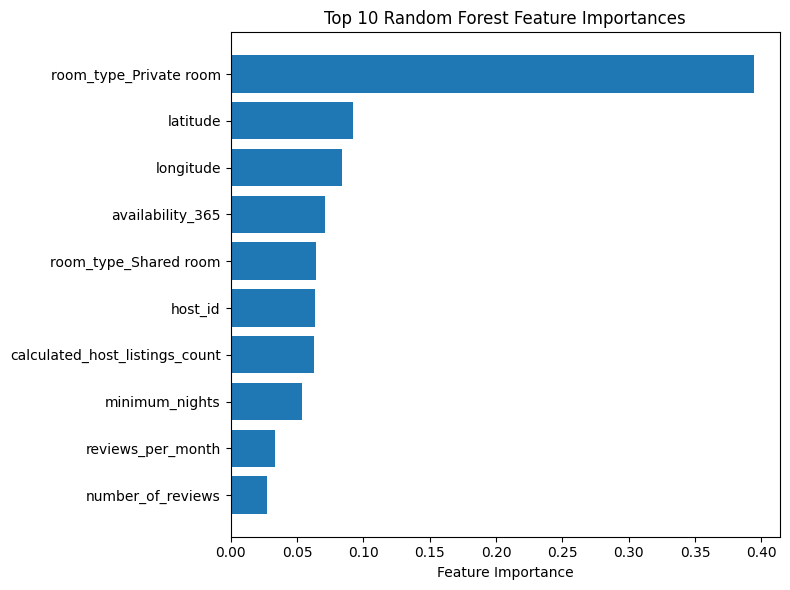

In [ ]:
import matplotlib.pyplot as plt

# Assume feat_imp is your pd.Series of importances, sorted descending
top10 = feat_imp.head(10)

plt.figure(figsize=(8, 6))
# horizontal bar chart, reversed so the largest is at the top
plt.barh(top10.index[::-1], top10.values[::-1])
plt.xlabel("Feature Importance")
plt.title("Top 10 Random Forest Feature Importances")
plt.tight_layout()
plt.show()

## 1.4 Evaluate and Improve the Model(s) Performance

### Voting Regressor Ensemble (With top 3 models)

In [ ]:
from sklearn.ensemble import VotingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np


rf_log = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42),
    func=np.log1p,
    inverse_func=np.expm1
)

xgb_log = TransformedTargetRegressor(
    regressor=XGBRegressor(random_state=42, n_jobs=-1, objective="reg:squarederror"),
    func=np.log1p,
    inverse_func=np.expm1
)

rf_raw = RandomForestRegressor(random_state=42)

voting_regressor_custom = VotingRegressor(estimators=[
    ("rf_raw", rf_raw),
    ("rf_log", rf_log),
    ("xgb_log", xgb_log),
])

voting_regressor_custom.fit(X_train, y_train_raw)

# ---- Train set ----
y_train_pred_raw = voting_regressor_custom.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

print("Voting Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()

# ---- Test set ----
y_test_pred_raw = voting_regressor_custom.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Voting Regressor

Train Performance (Raw Price)
MAE  = $13.68
RMSE = $20.60
R²    = 0.9362

Test Performance (Raw Price)
MAE  = $31.09
RMSE = $45.36
R²    = 0.6850


### Stacking Regressor Ensemble (With top 3 models)

In [ ]:
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.linear_model import RidgeCV
from xgboost import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

rf_log = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42),
    func=np.log1p,
    inverse_func=np.expm1
)

xgb_log = TransformedTargetRegressor(
    regressor=XGBRegressor(random_state=42, n_jobs=-1, objective="reg:squarederror"),
    func=np.log1p,
    inverse_func=np.expm1
)

rf_raw = RandomForestRegressor(random_state=42)

# Stacking with those three
stack_custom = StackingRegressor(
    estimators=[
        ("rf_raw", rf_raw),
        ("rf_log", rf_log),
        ("xgb_log", xgb_log),
    ],
    final_estimator=RidgeCV(),
    cv=5,
    n_jobs=-1,
    passthrough=False
)

# Fit on raw price target
stack_custom.fit(X_train, y_train_raw)

# Train predictions
y_train_pred_raw = stack_custom.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

# Test predictions
y_test_pred_raw = stack_custom.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Stacking Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")


Stacking Regressor

Train Performance (Raw Price)
MAE  = $13.09
RMSE = $18.75
R²    = 0.9471

Test Performance (Raw Price)
MAE  = $31.61
RMSE = $45.47
R²    = 0.6834


### GridSearch on XGBoost

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

param_grid = {
    "n_estimators": [100, 200],
    "learning_rate": [0.01, 0.05, 0.1],
    "max_depth": [3, 5, 7],
    "min_child_weight": [1, 3, 5],
    "gamma": [0, 1, 5],
    "subsample": [0.6, 0.8, 1.0],
    "colsample_bytree": [0.6, 0.8, 1.0],
    "reg_alpha": [0, 0.1, 1],
    "reg_lambda": [1, 5]
}

grid_xgb = GridSearchCV(
    estimator=XGBRegressor(random_state=42, objective="reg:squarederror"),
    param_grid=param_grid,
    cv=3,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    verbose=2
)

# Fit on raw price target
grid_xgb.fit(X_train, y_train_raw)

print("Best Params:", grid_xgb.best_params_)


Fitting 3 folds for each of 8748 candidates, totalling 26244 fits
Best Params: {'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'reg_alpha': 1, 'reg_lambda': 5, 'subsample': 0.8}


In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

xgb_best = XGBRegressor(
    random_state=42,
    objective="reg:squarederror",
    n_jobs=-1,
    colsample_bytree=0.6,
    gamma=0,
    learning_rate=0.1,
    max_depth=7,
    min_child_weight=1,
    n_estimators=200,
    reg_alpha=1,
    reg_lambda=5,
    subsample=0.8,
)

# Train
xgb_best.fit(X_train, y_train_raw)

# Predictions & evaluation
y_train_pred = xgb_best.predict(X_train)
mae_train = mean_absolute_error(y_train_raw, y_train_pred)
rmse_train = np.sqrt(mean_squared_error(y_train_raw, y_train_pred))
r2_train = r2_score(y_train_raw, y_train_pred)

y_test_pred = xgb_best.predict(X_test)
mae_test = mean_absolute_error(y_test_raw, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test_raw, y_test_pred))
r2_test = r2_score(y_test_raw, y_test_pred)

print("XGBoost Regressor\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train:.2f}")
print(f"RMSE = ${rmse_train:.2f}")
print(f"R²    = {r2_train:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test:.2f}")
print(f"RMSE = ${rmse_test:.2f}")
print(f"R²    = {r2_test:.4f}")


XGBoost Regressor

Train Performance (Raw Price)
MAE  = $18.11
RMSE = $25.73
R²    = 0.9004

Test Performance (Raw Price)
MAE  = $32.84
RMSE = $46.30
R²    = 0.6717


### GridSearch on Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# === Parameter grid (same for both variants) ===
param_grid = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": ["sqrt", "log2"],
}

# --- 1. Random Forest on raw price ---
grid_rf_raw = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    cv=3,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    verbose=2,
    refit=True,  # keep best estimator
)
grid_rf_raw.fit(X_train, y_train_raw)
print("Best Params RF (Raw Price):", grid_rf_raw.best_params_)

# --- 2. Random Forest on log(price) but evaluated on raw scale ---
# Wrap with TransformedTargetRegressor so it trains on log1p(price) and predicts back on raw
rf_log_wrapper = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42),
    func=np.log1p,
    inverse_func=np.expm1
)

grid_rf_log = GridSearchCV(
    estimator=rf_log_wrapper,
    param_grid={  # parameters for the underlying regressor need the prefix "regressor__"
        "regressor__n_estimators": [100, 200, 300],
        "regressor__max_depth": [None, 10, 20],
        "regressor__min_samples_split": [2, 5, 10],
        "regressor__min_samples_leaf": [1, 2, 4],
        "regressor__max_features": ["sqrt", "log2"],
    },
    cv=3,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
    verbose=2,
    refit=True,
)
# Fit with raw price; wrapper will log-transform internally
grid_rf_log.fit(X_train, y_train_raw)
print("Best Params RF (Log Price -> Raw):", grid_rf_log.best_params_)


Fitting 3 folds for each of 162 candidates, totalling 486 fits
Best Params RF (Raw Price): {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Fitting 3 folds for each of 162 candidates, totalling 486 fits
Best Params RF (Log Price -> Raw): {'regressor__max_depth': None, 'regressor__max_features': 'sqrt', 'regressor__min_samples_leaf': 1, 'regressor__min_samples_split': 2, 'regressor__n_estimators': 300}


Random Forest (Raw price)



In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

best_rf = RandomForestRegressor(
    random_state=42,
    n_estimators=300,
    max_depth=None,
    max_features='sqrt',
    min_samples_split=2,
    min_samples_leaf=1
)
best_rf.fit(X_train, y_train_raw)

y_train_pred_raw = best_rf.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = best_rf.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Tuned Random Forest Regressor (Raw)\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")



Tuned Random Forest Regressor (Raw)

Train Performance (Raw Price)
MAE  = $12.59
RMSE = $17.59
R²    = 0.9535

Test Performance (Raw Price)
MAE  = $33.68
RMSE = $46.54
R²    = 0.6685


Random Forest (Log price)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

best_rf = RandomForestRegressor(
    random_state=42,
    n_estimators=300,
    max_depth=None,
    max_features='sqrt',
    min_samples_split=2,
    min_samples_leaf=1
)
best_rf.fit(X_train, y_train_raw)

y_train_pred_raw = best_rf.predict(X_train)
mae_train_raw = mean_absolute_error(y_train_raw, y_train_pred_raw)
rmse_train_raw = np.sqrt(mean_squared_error(y_train_raw, y_train_pred_raw))
r2_train_raw = r2_score(y_train_raw, y_train_pred_raw)

y_test_pred_raw = best_rf.predict(X_test)
mae_test_raw = mean_absolute_error(y_test_raw, y_test_pred_raw)
rmse_test_raw = np.sqrt(mean_squared_error(y_test_raw, y_test_pred_raw))
r2_test_raw = r2_score(y_test_raw, y_test_pred_raw)

print("Tuned Random Forest Regressor (Raw)\n")
print("Train Performance (Raw Price)")
print(f"MAE  = ${mae_train_raw:.2f}")
print(f"RMSE = ${rmse_train_raw:.2f}")
print(f"R²    = {r2_train_raw:.4f}")
print()
print("Test Performance (Raw Price)")
print(f"MAE  = ${mae_test_raw:.2f}")
print(f"RMSE = ${rmse_test_raw:.2f}")
print(f"R²    = {r2_test_raw:.4f}")

Tuned Random Forest Regressor (Raw)

Train Performance (Raw Price)
MAE  = $12.59
RMSE = $17.59
R²    = 0.9535

Test Performance (Raw Price)
MAE  = $33.68
RMSE = $46.54
R²    = 0.6685


### Voting Regressor with Tuned models

In [ ]:
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# --- Untuned raw Random Forest ---
rf_raw_untuned = RandomForestRegressor(random_state=42)

# --- Untuned log-transformed Random Forest ---
rf_log_untuned = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42),
    func=np.log1p,
    inverse_func=np.expm1
)

# --- Tuned XGBoost on log price (assumed pre-tuned) ---
xgb_log_tuned = TransformedTargetRegressor(
    regressor=xgb_best,
    func=np.log1p,
    inverse_func=np.expm1
)

# --- Voting Regressor combining untuned RFs and tuned XGB ---
voting = VotingRegressor(
    estimators=[
        ("rf_raw_untuned", rf_raw_untuned),
        ("rf_log_untuned", rf_log_untuned),
        ("xgb_log_tuned", xgb_log_tuned),
    ]
)

# --- Fit on raw target ---
voting.fit(X_train, y_train_raw)

# --- Predict on Train Set ---
y_train_pred = voting.predict(X_train)
mae_train = mean_absolute_error(y_train_raw, y_train_pred)
rmse_train = np.sqrt(mean_squared_error(y_train_raw, y_train_pred))
r2_train = r2_score(y_train_raw, y_train_pred)

# --- Predict on Test Set ---
y_test_pred = voting.predict(X_test)
mae_test = mean_absolute_error(y_test_raw, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test_raw, y_test_pred))
r2_test = r2_score(y_test_raw, y_test_pred)

# --- Print results in your format ---
print("Voting Regressor (Untuned RFs + Tuned XGB, Log Price converted back)\n")

print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train:.2f}")
print(f"RMSE = ${rmse_train:.2f}")
print(f"R²    = {r2_train:.4f}")
print()

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test:.2f}")
print(f"RMSE = ${rmse_test:.2f}")
print(f"R²    = {r2_test:.4f}")


Voting Regressor (Untuned RFs + Tuned XGB, Log Price converted back)

Train Performance (Log Price (converted back))
MAE  = $14.88
RMSE = $22.52
R²    = 0.9237

Test Performance (Log Price (converted back))
MAE  = $31.10
RMSE = $45.39
R²    = 0.6846


### Stacking Regressor with Tuned models

In [ ]:
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.linear_model import RidgeCV
from xgboost import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# --- Untuned base learners ---
# Raw RF (untuned)
rf_raw_untuned = RandomForestRegressor(random_state=42, n_jobs=-1)

# Log-target RF (untuned) wrapped
rf_log_untuned = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42, n_jobs=-1),
    func=np.log1p,
    inverse_func=np.expm1
)

# Log-target XGB (untuned) wrapped
xgb_log_untuned = TransformedTargetRegressor(
    regressor=XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1,
        verbosity=0
    ),
    func=np.log1p,
    inverse_func=np.expm1
)

# --- Meta-learner ---
final_estimator = RidgeCV(
    alphas=[0.01, 0.1, 1.0, 10.0],
    scoring="neg_root_mean_squared_error"
)

# --- Stacking regressor (untuned base models) ---
stack_untuned = StackingRegressor(
    estimators=[
        ("rf_raw", rf_raw_untuned),
        ("rf_log", rf_log_untuned),
        ("xgb_log", xgb_log_untuned),
    ],
    final_estimator=final_estimator,
    cv=5,
    passthrough=False,
    n_jobs=-1,
    verbose=1
)

# --- Fit on raw target ---
stack_untuned.fit(X_train, y_train_raw)

# --- Predict on Train Set ---
y_train_pred = stack_untuned.predict(X_train)
mae_train = mean_absolute_error(y_train_raw, y_train_pred)
rmse_train = np.sqrt(mean_squared_error(y_train_raw, y_train_pred))
r2_train = r2_score(y_train_raw, y_train_pred)

# --- Predict on Test Set ---
y_test_pred = stack_untuned.predict(X_test)
mae_test = mean_absolute_error(y_test_raw, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test_raw, y_test_pred))
r2_test = r2_score(y_test_raw, y_test_pred)

# --- Print results in your format ---
print("Stacking Regressor (Untuned RFs + Untuned XGB, Log Price converted back)\n")

print("Train Performance (Log Price (converted back))")
print(f"MAE  = ${mae_train:.2f}")
print(f"RMSE = ${rmse_train:.2f}")
print(f"R²    = {r2_train:.4f}")
print()

print("Test Performance (Log Price (converted back))")
print(f"MAE  = ${mae_test:.2f}")
print(f"RMSE = ${rmse_test:.2f}")
print(f"R²    = {r2_test:.4f}")


Stacking Regressor (Untuned RFs + Untuned XGB, Log Price converted back)

Train Performance (Log Price (converted back))
MAE  = $13.09
RMSE = $18.75
R²    = 0.9471

Test Performance (Log Price (converted back))
MAE  = $31.61
RMSE = $45.47
R²    = 0.6834


## 1.5 Summarize the findings

In [ ]:
import pandas as pd

# === Your updated results ===
results = {
    "Voting (top 3)": {
        "Train": {"MAE": 13.68, "RMSE": 20.60, "R2": 0.9362},
        "Test":  {"MAE": 31.09, "RMSE": 45.36, "R2": 0.6850},
    },
    "Stacking (top 3)": {
        "Train": {"MAE": 14.95, "RMSE": 21.50, "R2": 0.9304},
        "Test":  {"MAE": 32.23, "RMSE": 45.62, "R2": 0.6814},
    },
    "XGBoost (GridSearch)": {
        "Train": {"MAE": 18.11, "RMSE": 25.73, "R2": 0.9004},
        "Test":  {"MAE": 32.84, "RMSE": 46.30, "R2": 0.6717},
    },
    "RF (GridSearch, raw)": {
        "Train": {"MAE": 12.59, "RMSE": 17.59, "R2": 0.9535},
        "Test":  {"MAE": 33.68, "RMSE": 46.54, "R2": 0.6685},
    },
    "RF (GridSearch, log->raw)": {
        "Train": {"MAE": 12.96, "RMSE": 21.07, "R2": 0.9332},
        "Test":  {"MAE": 32.10, "RMSE": 47.00, "R2": 0.6618},
    },
    "Voting (tuned)": {
        "Train": {"MAE": 14.88, "RMSE": 22.52, "R2": 0.9237},  # UPDATED
        "Test":  {"MAE": 31.10, "RMSE": 45.39, "R2": 0.6846},  # UPDATED
    },
    "Stacking (tuned)": {
        "Train": {"MAE": 13.09, "RMSE": 18.75, "R2": 0.9471},  # UPDATED
        "Test":  {"MAE": 31.61, "RMSE": 45.47, "R2": 0.6834},  # UPDATED
    },
}

# === Flatten dictionary into DataFrame ===
records = []
for model, splits in results.items():
    row = {"Model": model}
    row.update({
        "MAE Train": splits["Train"]["MAE"],
        "MAE Test": splits["Test"]["MAE"],
        "RMSE Train": splits["Train"]["RMSE"],
        "RMSE Test": splits["Test"]["RMSE"],
        "R² Train": splits["Train"]["R2"],
        "R² Test": splits["Test"]["R2"],
    })
    records.append(row)

df = pd.DataFrame(records)

# === Optional: custom row order ===
order = [
    "Voting (top 3)",
    "Stacking (top 3)",
    "XGBoost (GridSearch)",
    "RF (GridSearch, raw)",
    "RF (GridSearch, log->raw)",
    "Voting (tuned)",
    "Stacking (tuned)",
]
df["Model"] = pd.Categorical(df["Model"], categories=order, ordered=True)
df = df.sort_values("Model").reset_index(drop=True)

# === Format values for readability ===
df_display = df.copy()
df_display["MAE Train"] = df_display["MAE Train"].map(lambda x: f"${x:,.2f}")
df_display["MAE Test"] = df_display["MAE Test"].map(lambda x: f"${x:,.2f}")
df_display["RMSE Train"] = df_display["RMSE Train"].map(lambda x: f"${x:,.2f}")
df_display["RMSE Test"] = df_display["RMSE Test"].map(lambda x: f"${x:,.2f}")
df_display["R² Train"] = df_display["R² Train"].map(lambda x: f"{x:.4f}")
df_display["R² Test"] = df_display["R² Test"].map(lambda x: f"{x:.4f}")

# === Print as markdown table ===
print(df_display.to_markdown(index=False))


| Model                     | MAE Train   | MAE Test   | RMSE Train   | RMSE Test   |   R² Train |   R² Test |
|:--------------------------|:------------|:-----------|:-------------|:------------|-----------:|----------:|
| Voting (top 3)            | $13.68      | $31.09     | $20.60       | $45.36      |     0.9362 |    0.685  |
| Stacking (top 3)          | $14.95      | $32.23     | $21.50       | $45.62      |     0.9304 |    0.6814 |
| XGBoost (GridSearch)      | $18.11      | $32.84     | $25.73       | $46.30      |     0.9004 |    0.6717 |
| RF (GridSearch, raw)      | $12.59      | $33.68     | $17.59       | $46.54      |     0.9535 |    0.6685 |
| RF (GridSearch, log->raw) | $12.96      | $32.10     | $21.07       | $47.00      |     0.9332 |    0.6618 |
| Voting (tuned)            | $14.88      | $31.10     | $22.52       | $45.39      |     0.9237 |    0.6846 |
| Stacking (tuned)          | $13.09      | $31.61     | $18.75       | $45.47      |     0.9471 |    0.6834 |


# Task 2: Unsupervised learning Using HR Dataset

# 2.1 Load and Explore the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
hr = pd.read_csv('/content/drive/My Drive/ML assg/hr_data.csv')
print(hr.head())

   employee_id         department     region         education gender  \
0        65438  Sales & Marketing   region_7  Master's & above      f   
1        65141         Operations  region_22        Bachelor's      m   
2         7513  Sales & Marketing  region_19        Bachelor's      m   
3         2542  Sales & Marketing  region_23        Bachelor's      m   
4        48945         Technology  region_26        Bachelor's      m   

  recruitment_channel  no_of_trainings  age  previous_year_rating  \
0            sourcing                1   35                   5.0   
1               other                1   30                   5.0   
2            sourcing                1   34                   3.0   
3               other                2   39                   1.0   
4               other                1   45                   3.0   

   length_of_service  KPIs_met >80%  awards_won?  avg_training_score  \
0                  8              1            0                  49   
1 

In [ ]:
print(hr.isna().sum())

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64


In [ ]:
print(hr.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB
None


In [ ]:
print(hr.describe())

        employee_id  no_of_trainings           age  previous_year_rating  \
count  54808.000000     54808.000000  54808.000000          50684.000000   
mean   39195.830627         1.253011     34.803915              3.329256   
std    22586.581449         0.609264      7.660169              1.259993   
min        1.000000         1.000000     20.000000              1.000000   
25%    19669.750000         1.000000     29.000000              3.000000   
50%    39225.500000         1.000000     33.000000              3.000000   
75%    58730.500000         1.000000     39.000000              4.000000   
max    78298.000000        10.000000     60.000000              5.000000   

       length_of_service  KPIs_met >80%   awards_won?  avg_training_score  \
count       54808.000000   54808.000000  54808.000000        54808.000000   
mean            5.865512       0.351974      0.023172           63.386750   
std             4.265094       0.477590      0.150450           13.371559   
min    

In [ ]:
print("Shape:", hr.shape)

Shape: (54808, 12)


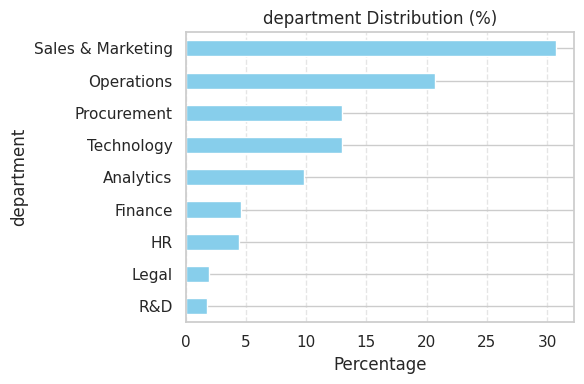

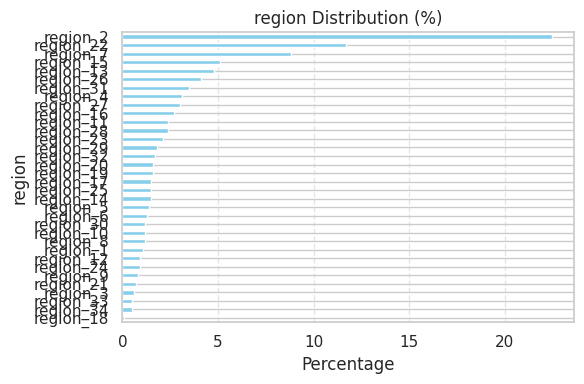

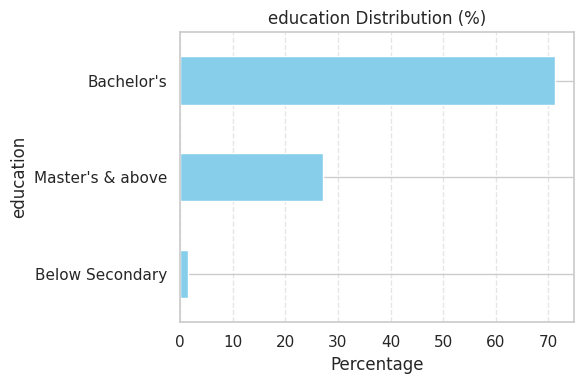

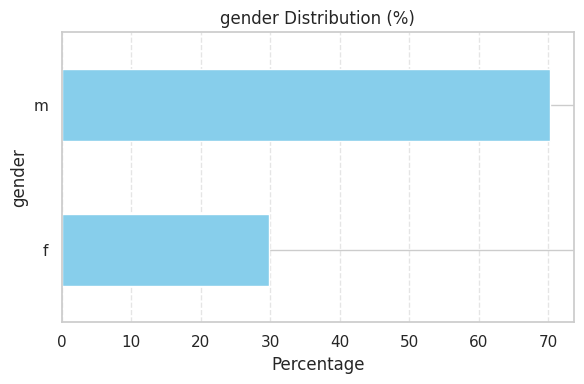

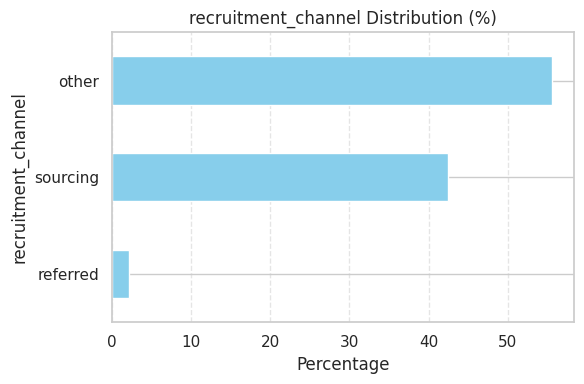

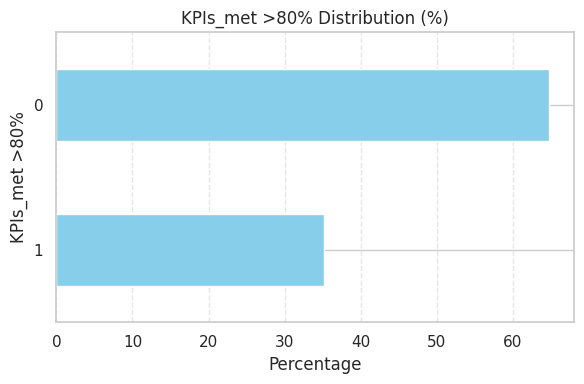

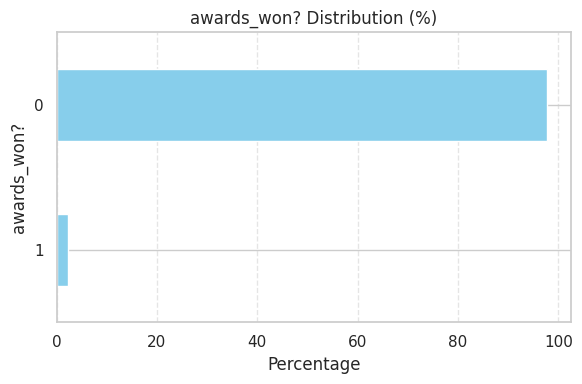

In [ ]:
hr.describe().T

# For categorical fields, see unique counts
for col in ['department','region','education','gender','recruitment_channel','KPIs_met >80%','awards_won?']:
    print(col, "→", hr[col].nunique())
    display(hr[col].value_counts(normalize=True).mul(100).round(1).astype(str) + '%')
    print()

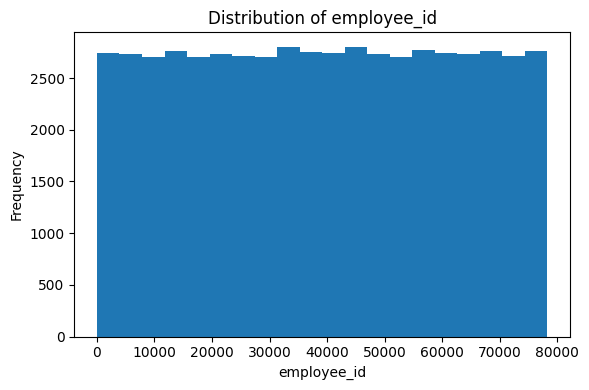

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['employee_id'].dropna(), bins=20)
plt.title('Distribution of employee_id')
plt.xlabel('employee_id')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


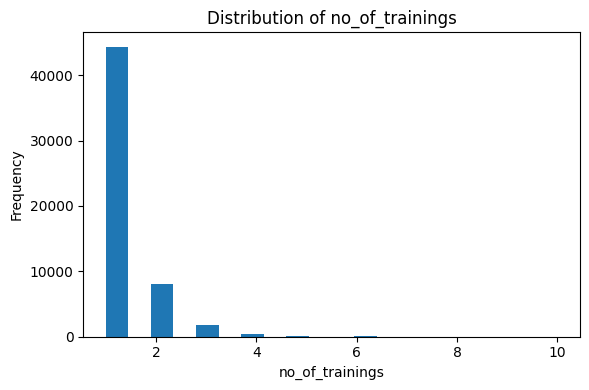

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['no_of_trainings'].dropna(), bins=20)
plt.title('Distribution of no_of_trainings')
plt.xlabel('no_of_trainings')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


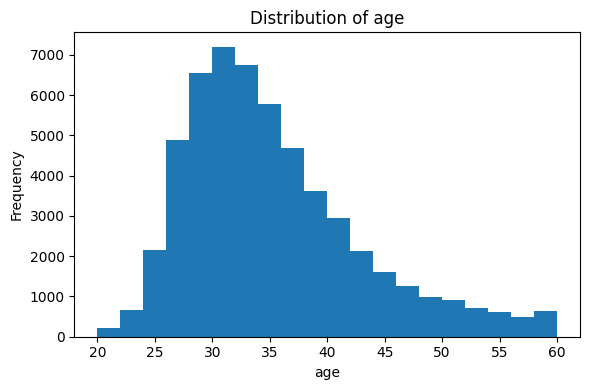

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['age'].dropna(), bins=20)
plt.title('Distribution of age')
plt.xlabel('age')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


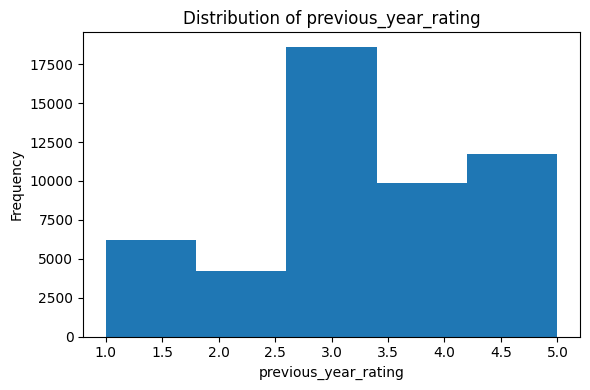

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['previous_year_rating'].dropna(), bins=5)
plt.title('Distribution of previous_year_rating')
plt.xlabel('previous_year_rating')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


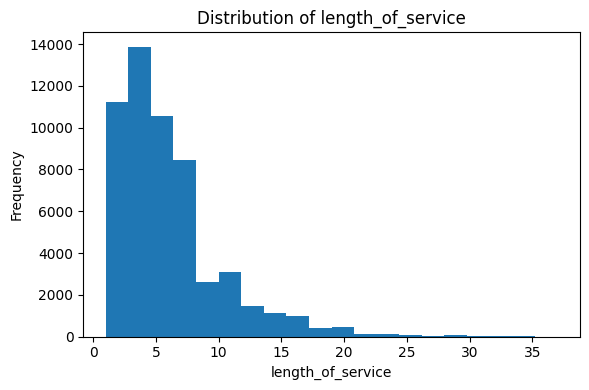

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['length_of_service'].dropna(), bins=20)
plt.title('Distribution of length_of_service')
plt.xlabel('length_of_service')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


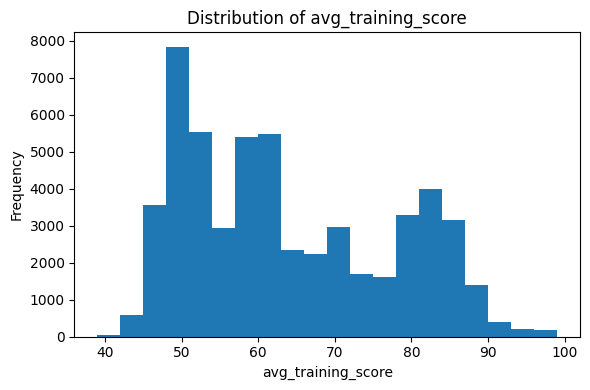

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(hr['avg_training_score'].dropna(), bins=20)
plt.title('Distribution of avg_training_score')
plt.xlabel('avg_training_score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


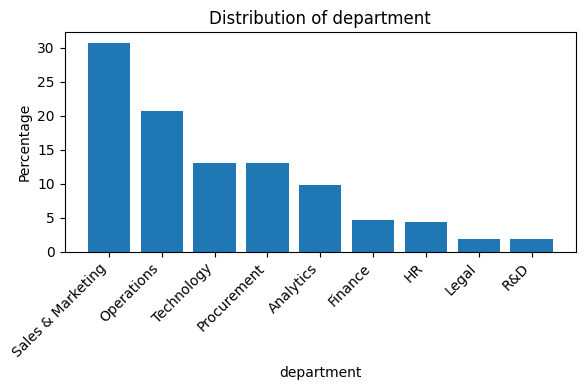

In [ ]:
counts = hr['department'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index, counts.values)
plt.title('Distribution of department')
plt.xlabel('department')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


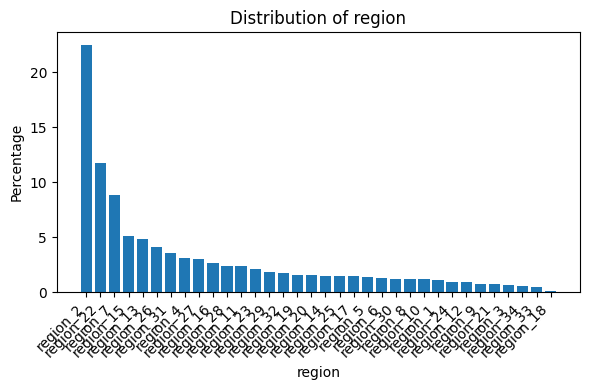

In [ ]:
counts = hr['region'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index.astype(str), counts.values)
plt.title('Distribution of region')
plt.xlabel('region')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


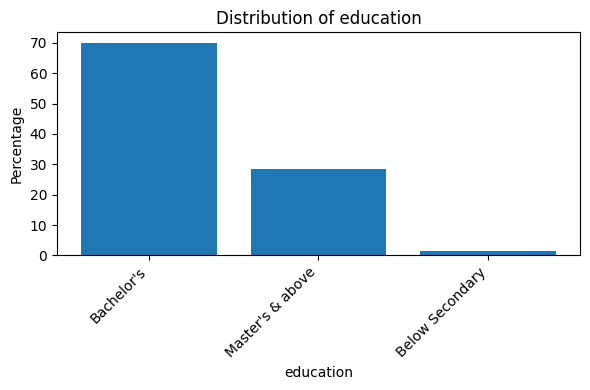

In [ ]:
counts = hr['education'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index, counts.values)
plt.title('Distribution of education')
plt.xlabel('education')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


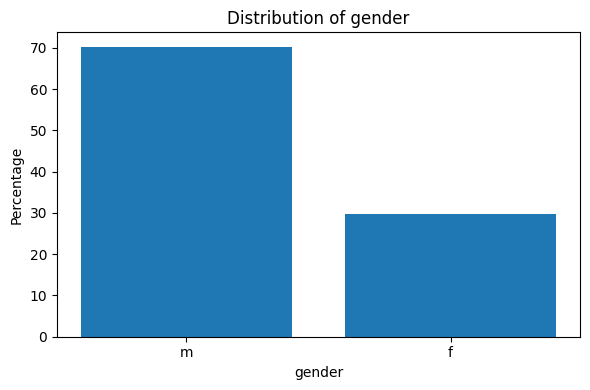

In [ ]:
counts = hr['gender'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index, counts.values)
plt.title('Distribution of gender')
plt.xlabel('gender')
plt.ylabel('Percentage')
plt.tight_layout()
plt.show()


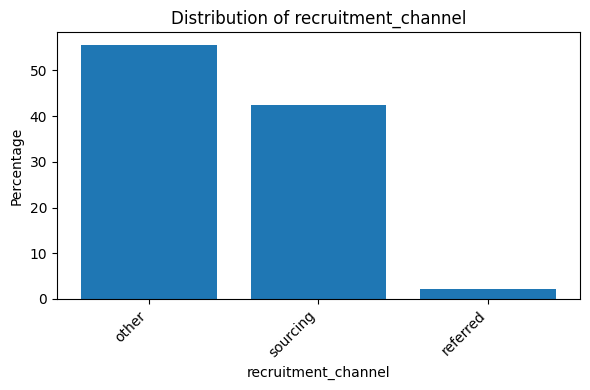

In [ ]:
counts = hr['recruitment_channel'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index, counts.values)
plt.title('Distribution of recruitment_channel')
plt.xlabel('recruitment_channel')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


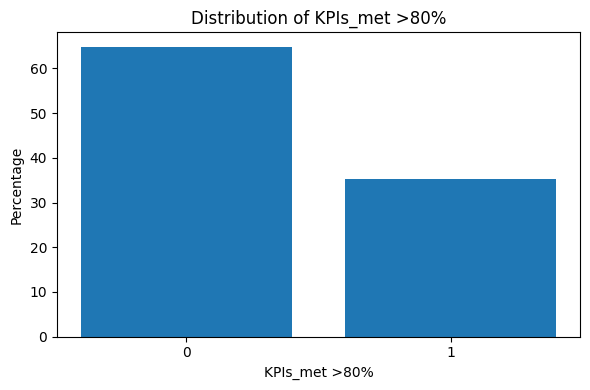

In [ ]:
counts = hr['KPIs_met >80%'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index.astype(str), counts.values)
plt.title('Distribution of KPIs_met >80%')
plt.xlabel('KPIs_met >80%')
plt.ylabel('Percentage')
plt.tight_layout()
plt.show()


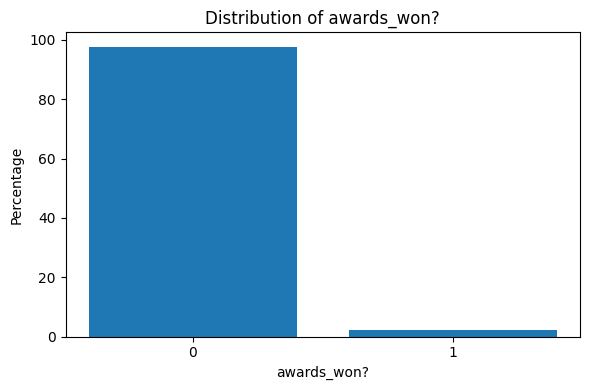

In [ ]:
counts = hr['awards_won?'].value_counts(normalize=True).mul(100).sort_values(ascending=False)
plt.figure(figsize=(6,4))
plt.bar(counts.index.astype(str), counts.values)
plt.title('Distribution of awards_won?')
plt.xlabel('awards_won?')
plt.ylabel('Percentage')
plt.tight_layout()
plt.show()


# 2.2 Cleanse and Transform the data

In [ ]:
hr = pd.read_csv('/content/drive/My Drive/ML assg/hr_data.csv')
print(hr.head())

   employee_id         department     region         education gender  \
0        65438  Sales & Marketing   region_7  Master's & above      f   
1        65141         Operations  region_22        Bachelor's      m   
2         7513  Sales & Marketing  region_19        Bachelor's      m   
3         2542  Sales & Marketing  region_23        Bachelor's      m   
4        48945         Technology  region_26        Bachelor's      m   

  recruitment_channel  no_of_trainings  age  previous_year_rating  \
0            sourcing                1   35                   5.0   
1               other                1   30                   5.0   
2            sourcing                1   34                   3.0   
3               other                2   39                   1.0   
4               other                1   45                   3.0   

   length_of_service  KPIs_met >80%  awards_won?  avg_training_score  \
0                  8              1            0                  49   
1 

### Missing Values

In [ ]:
# Fill missing 'education' with mode
hr['education'].fillna(hr['education'].mode()[0], inplace=True)

# Fill missing 'previous_year_rating' with median
hr['previous_year_rating'].fillna(hr['previous_year_rating'].median(), inplace=True)


/tmp/ipython-input-2540130974.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  hr['education'].fillna(hr['education'].mode()[0], inplace=True)
/tmp/ipython-input-2540130974.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace

### Outliers

In [ ]:
num_cols = ['no_of_trainings', 'age', 'previous_year_rating',
            'length_of_service', 'avg_training_score']

for col in num_cols:
    if col in hr.columns:
        Q1 = hr[col].quantile(0.25)
        Q3= hr[col].quantile(0.75)
        IQR = Q3-Q1
        lower = Q1 -1.5*IQR
        upper = Q3 + 1.5 * IQR
        hr[col] = hr[col].clip(lower,upper)

### Dropping Columns

In [ ]:
hr.drop(columns=['employee_id','is_promoted'], inplace=True)



### One-hot Encoding

In [ ]:
hr_encoded = pd.get_dummies(hr, drop_first=True)

### Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hr_scaled = scaler.fit_transform(hr_encoded)


In [ ]:
df_hr_scaled = hr

print(df_hr_scaled.shape)
print(df_hr_scaled.head())
X = df_hr_scaled.to_numpy()



(54808, 12)
          department     region         education gender recruitment_channel  \
0  Sales & Marketing   region_7  Master's & above      f            sourcing   
1         Operations  region_22        Bachelor's      m               other   
2  Sales & Marketing  region_19        Bachelor's      m            sourcing   
3  Sales & Marketing  region_23        Bachelor's      m               other   
4         Technology  region_26        Bachelor's      m               other   

   no_of_trainings  age  previous_year_rating  length_of_service  \
0                1   35                   5.0                  8   
1                1   30                   5.0                  4   
2                1   34                   3.0                  7   
3                1   39                   1.5                 10   
4                1   45                   3.0                  2   

   KPIs_met >80%  awards_won?  avg_training_score  
0              1            0                 

In [ ]:
print(hr.isnull().sum())

department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
dtype: int64


# 2.3 Build the Clustering Model

## K-Means Clustering

### Elbow Method and Silhouette Score (KMeans)

When number of PCA components = 3

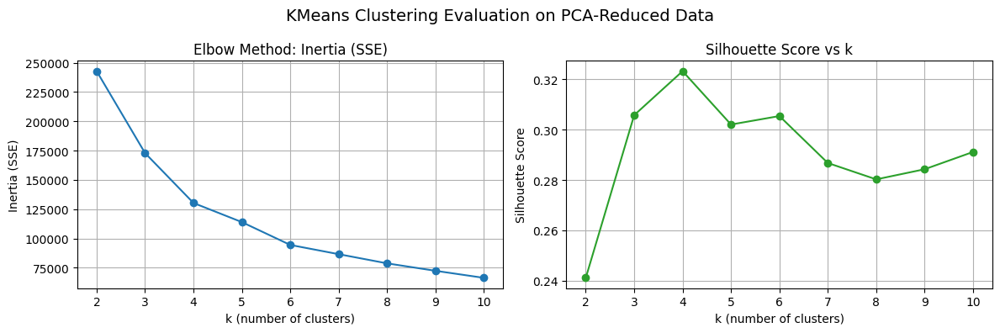

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

pca = PCA(n_components=3)
hr_pca = pca.fit_transform(hr_scaled)
sil_scores = []
inertias = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(hr_pca)
    sil_scores.append(silhouette_score(hr_pca, labels))
    inertias.append(kmeans.inertia_)

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Elbow Plot
axes[0].plot(K_range, inertias, marker='o', color='tab:blue')
axes[0].set_title('Elbow Method: Inertia (SSE)')
axes[0].set_xlabel('k (number of clusters)')
axes[0].set_ylabel('Inertia (SSE)')
axes[0].grid(True)

# Silhouette Plot
axes[1].plot(K_range, sil_scores, marker='o', color='tab:green')
axes[1].set_title('Silhouette Score vs k')
axes[1].set_xlabel('k (number of clusters)')
axes[1].set_ylabel('Silhouette Score')
axes[1].grid(True)

plt.suptitle('KMeans Clustering Evaluation on PCA-Reduced Data', fontsize=14)
plt.tight_layout()
plt.show()


When number of PCA components = 0.95

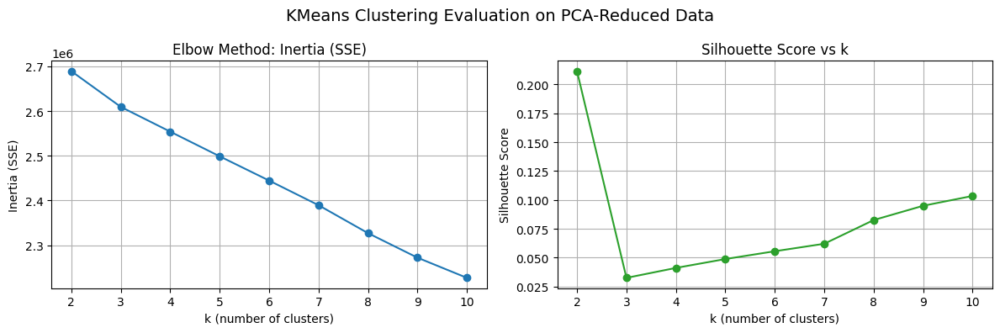

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

pca = PCA(n_components=0.95)
hr_pca = pca.fit_transform(hr_scaled)
sil_scores = []
inertias = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(hr_pca)
    sil_scores.append(silhouette_score(hr_pca, labels))
    inertias.append(kmeans.inertia_)

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Elbow Plot
axes[0].plot(K_range, inertias, marker='o', color='tab:blue')
axes[0].set_title('Elbow Method: Inertia (SSE)')
axes[0].set_xlabel('k (number of clusters)')
axes[0].set_ylabel('Inertia (SSE)')
axes[0].grid(True)

# Silhouette Plot
axes[1].plot(K_range, sil_scores, marker='o', color='tab:green')
axes[1].set_title('Silhouette Score vs k')
axes[1].set_xlabel('k (number of clusters)')
axes[1].set_ylabel('Silhouette Score')
axes[1].grid(True)

plt.suptitle('KMeans Clustering Evaluation on PCA-Reduced Data', fontsize=14)
plt.tight_layout()
plt.show()


When number of PCA components = 2

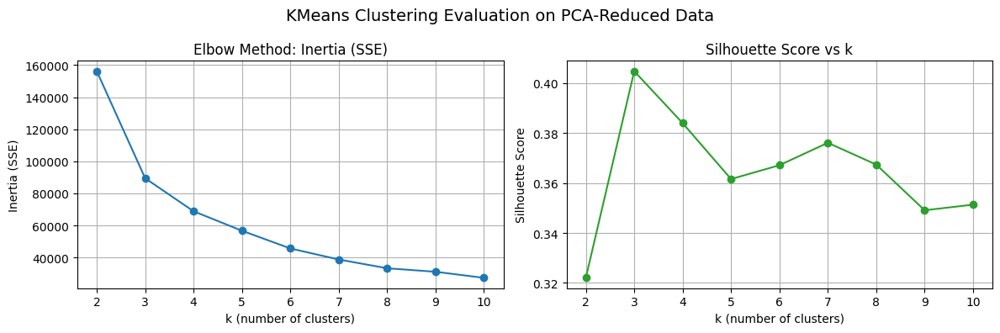

In [ ]:
from sklearn.cluster import KMeans

pca = PCA(n_components=2)
hr_pca = pca.fit_transform(hr_scaled)
sil_scores = []
inertias = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(hr_pca)
    sil_scores.append(silhouette_score(hr_pca, labels))
    inertias.append(kmeans.inertia_)

import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Elbow Plot
axes[0].plot(K_range, inertias, marker='o', color='tab:blue')
axes[0].set_title('Elbow Method: Inertia (SSE)')
axes[0].set_xlabel('k (number of clusters)')
axes[0].set_ylabel('Inertia (SSE)')
axes[0].grid(True)

# Silhouette Plot
axes[1].plot(K_range, sil_scores, marker='o', color='tab:green')
axes[1].set_title('Silhouette Score vs k')
axes[1].set_xlabel('k (number of clusters)')
axes[1].set_ylabel('Silhouette Score')
axes[1].grid(True)

plt.suptitle('KMeans Clustering Evaluation on PCA-Reduced Data', fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)  # auto-select # of components
hr_pca = pca.fit_transform(hr_scaled)

# Step 2: Show how many components were retained
print(f"PCA retained {pca.n_components_} components to preserve ≥95% of variance.")
print(f"Explained variance ratio (first few): {np.round(pca.explained_variance_ratio_, 3)[:5]}")
print(f"Total variance explained: {np.sum(pca.explained_variance_ratio_):.3f}")


PCA retained 2 components to preserve ≥95% of variance.
Explained variance ratio (first few): [0.042 0.041]
Total variance explained: 0.083


In [ ]:
# Get best k based on silhouette score
best_k = K_range[np.argmax(sil_scores)]
print(f"Best k = {best_k}")


Best k = 3


In [ ]:
# Final KMeans fit
final_kmeans = KMeans(n_clusters=best_k, random_state=42)
final_labels = final_kmeans.fit_predict(hr_pca)

# Add cluster labels to original hr DataFrame
hr_clustered = hr.copy()
hr_clustered['Cluster'] = final_labels

cluster_summary = hr_clustered.groupby('Cluster').mean(numeric_only=True)
print(cluster_summary)


         no_of_trainings        age  previous_year_rating  length_of_service  \
Cluster                                                                        
0                    1.0  30.631218              3.451154           3.872071   
1                    1.0  42.294251              3.539687           8.643338   
2                    1.0  33.183052              3.084537           5.002446   

         KPIs_met >80%  awards_won?  avg_training_score  
Cluster                                                  
0             0.434932     0.033300           72.253199  
1             0.359834     0.016056           65.254694  
2             0.237682     0.016482           50.246593  


In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)  # if too wide
display(cluster_summary.round(2))  # optional: round for readability



,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
Cluster,,,,,,,
0,1.0,30.63,3.45,3.87,0.43,0.03,72.25
1,1.0,42.29,3.54,8.64,0.36,0.02,65.25
2,1.0,33.18,3.08,5.00,0.24,0.02,50.25


## Hierarchical Clustering

### Dendrogram

Tried with ward linkage method

Auto-selected threshold: 229.43


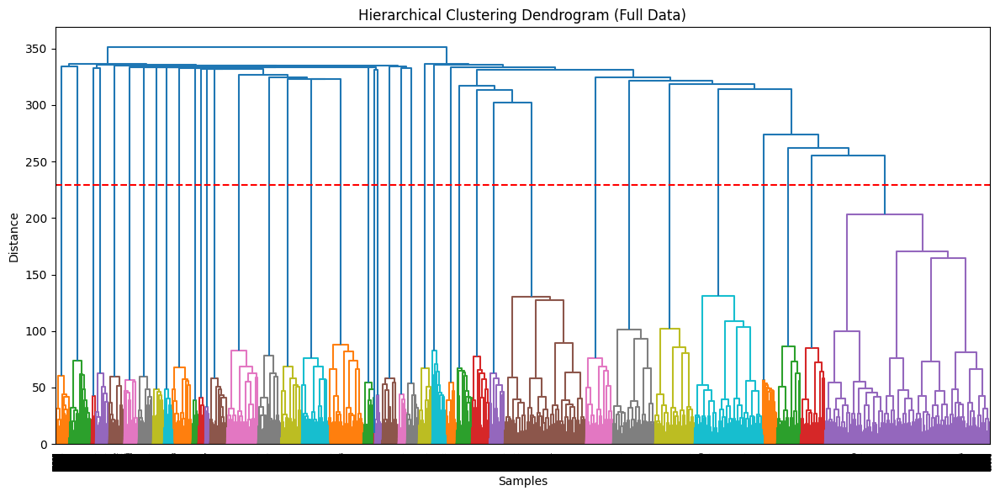

Silhouette Score (using threshold): 0.3603


In [ ]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

pca = PCA(n_components=0.95)
hr_pca = pca.fit_transform(hr_scaled)

hr_pca_df = pd.DataFrame(hr_pca, columns=[f'PC{i+1}' for i in range(hr_pca.shape[1])])

hr_pca_sample = hr_pca_df

linkage_matrix = sch.linkage(hr_pca_sample.values, method='ward')

distances = linkage_matrix[:, 2]
sorted_dist = np.sort(distances)
gaps = np.diff(sorted_dist)
largest_gap_index = np.argmax(gaps)
threshold = (sorted_dist[largest_gap_index] + sorted_dist[largest_gap_index + 1]) / 2
print(f"Auto-selected threshold: {threshold:.2f}")

plt.figure(figsize=(12, 6))
dendro = sch.dendrogram(linkage_matrix, color_threshold=threshold)
plt.axhline(y=threshold, color='r', linestyle='--')
plt.title('Hierarchical Clustering Dendrogram (Full Data)')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

final_labels = fcluster(linkage_matrix, t=threshold, criterion='distance')
sil_score = silhouette_score(hr_pca_sample, final_labels)
print(f"Silhouette Score (using threshold): {sil_score:.4f}")


Tried with Complete linkage method

Auto-selected threshold: 34.35


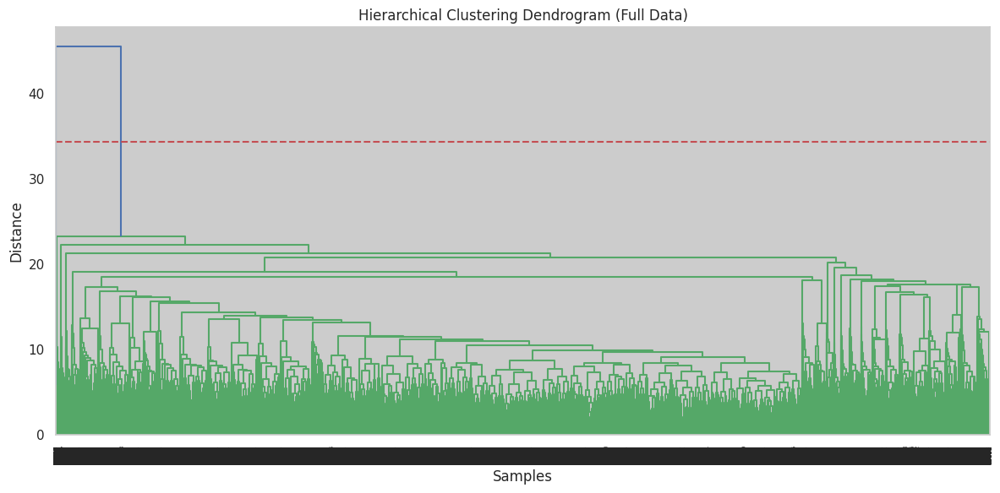

Silhouette Score (using threshold): 0.7772


In [ ]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

pca = PCA(n_components=0.95)
hr_pca = pca.fit_transform(hr_scaled)

hr_pca_df = pd.DataFrame(hr_pca, columns=[f'PC{i+1}' for i in range(hr_pca.shape[1])])

hr_pca_sample = hr_pca_df

linkage_matrix = sch.linkage(hr_pca_sample.values, method='complete')

distances = linkage_matrix[:, 2]
sorted_dist = np.sort(distances)
gaps = np.diff(sorted_dist)
largest_gap_index = np.argmax(gaps)
threshold = (sorted_dist[largest_gap_index] + sorted_dist[largest_gap_index + 1]) / 2
print(f"Auto-selected threshold: {threshold:.2f}")

plt.figure(figsize=(12, 6))
dendro = sch.dendrogram(linkage_matrix, color_threshold=threshold)
plt.axhline(y=threshold, color='r', linestyle='--')
plt.title('Hierarchical Clustering Dendrogram (Full Data)')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

final_labels = fcluster(linkage_matrix, t=threshold, criterion='distance')
sil_score = silhouette_score(hr_pca_sample, final_labels)
print(f"Silhouette Score (using threshold): {sil_score:.4f}")



In [ ]:
print(f"Number of clusters formed: {len(np.unique(final_labels))}")


Number of clusters formed: 2


k = 2 → Silhouette Score: 0.7772
k = 3 → Silhouette Score: 0.4249
k = 4 → Silhouette Score: 0.4096
k = 5 → Silhouette Score: 0.3777
k = 6 → Silhouette Score: 0.2002
k = 7 → Silhouette Score: 0.2017
k = 8 → Silhouette Score: 0.2031
k = 9 → Silhouette Score: 0.2110
k = 10 → Silhouette Score: 0.2133


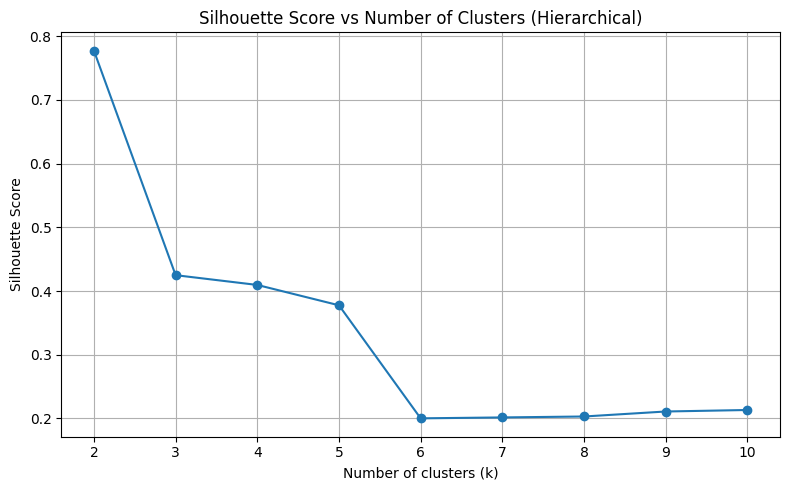

✅ Best number of clusters based on silhouette: k = 2


In [ ]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Try a range of cluster counts
range_k = range(2, 11)
scores = []

for k in range_k:
    labels = fcluster(linkage_matrix, k, criterion='maxclust')
    score = silhouette_score(hr_pca_sample, labels)
    scores.append(score)
    print(f"k = {k} → Silhouette Score: {score:.4f}")

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(range_k, scores, marker='o')
plt.title('Silhouette Score vs Number of Clusters (Hierarchical)')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.tight_layout()
plt.show()

# Best k
best_k = range_k[np.argmax(scores)]
print(f"✅ Best number of clusters based on silhouette: k = {best_k}")


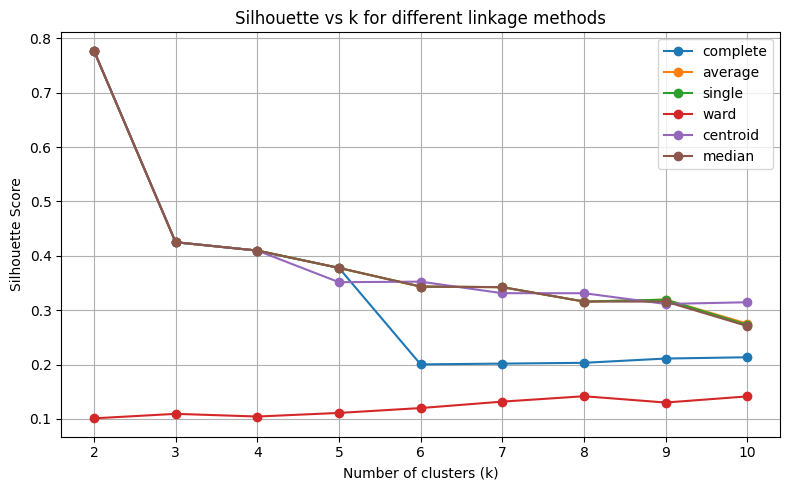

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
hr_pca = pca.fit_transform(hr_scaled)

# Step 2: Create DataFrame
hr_pca_df = pd.DataFrame(hr_pca, columns=[f'PC{i+1}' for i in range(hr_pca.shape[1])])

hr_pca_sample = hr_pca_df  # Full dataset


linkage_methods = ['complete', 'average', 'single', 'ward' ,'centroid', 'median']
max_k = 10  # evaluate up to this many clusters

results = {}

for method in linkage_methods:
    Z = linkage(hr_pca_sample.values, method=method)
    sil_scores = []
    ks = list(range(2, max_k+1))
    for k in ks:
        # derive flat clusters by cutting to get k clusters
        labels = fcluster(Z, t=k, criterion='maxclust')
        if len(set(labels)) == 1 or len(set(labels)) == len(hr_pca_sample):
            sil_scores.append(float('nan'))  # invalid
        else:
            score = silhouette_score(hr_pca_sample.values, labels)
            sil_scores.append(score)
    results[method] = (ks, sil_scores)

# Plot
plt.figure(figsize=(8, 5))
for method, (ks, scores) in results.items():
    plt.plot(ks, scores, marker='o', label=method)
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette vs k for different linkage methods')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# 2.4 Evaluate and Improve the Model(s) Performance

## K-Means Clustering

2D PCA plot

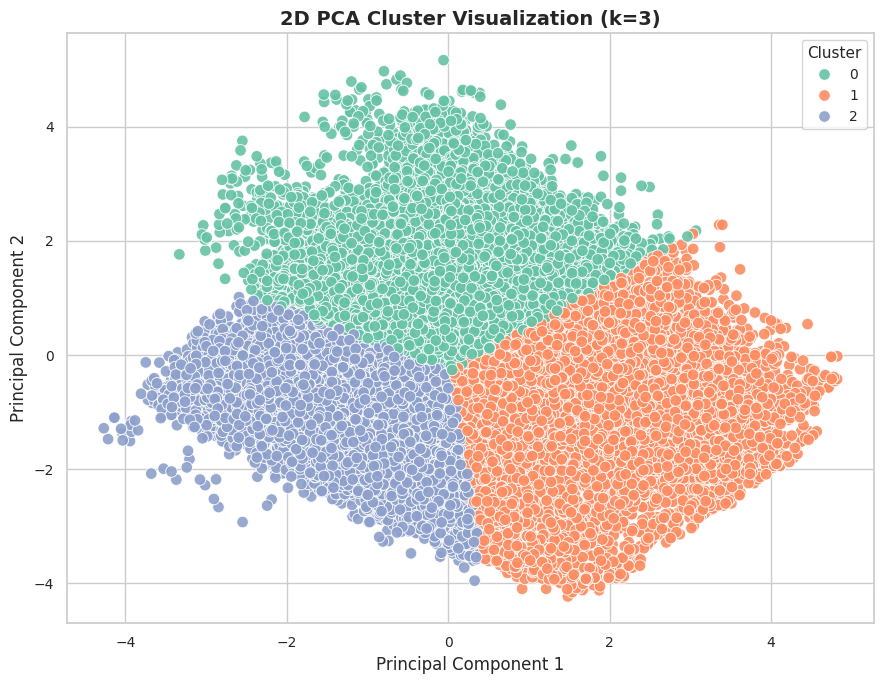

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# PCA to 2D
pca_2d = PCA(n_components=2)
hr_pca_2d = pca_2d.fit_transform(hr_scaled)

# KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(hr_pca_2d)

# Plot without outlines
plt.figure(figsize=(9, 7))
sns.set(style='whitegrid')

palette = sns.color_palette("Set2", 3)
sns.scatterplot(
    x=hr_pca_2d[:, 0], y=hr_pca_2d[:, 1],
    hue=labels, palette=palette,
    s=70, alpha=0.9  # ← no edgecolor, no linewidth
)

plt.title("2D PCA Cluster Visualization (k=3)", fontsize=14, weight='bold')
plt.xlabel("Principal Component 1", fontsize=12)
plt.ylabel("Principal Component 2", fontsize=12)
plt.legend(title="Cluster", loc='upper right', fontsize=10, title_fontsize=11)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


3D PCA Plot

In [ ]:
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Step 1: Run PCA with 3 components
pca = PCA(n_components=3, random_state=42)
hr_pca = pca.fit_transform(hr_scaled)

# Step 2: KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(hr_pca)
centers = kmeans.cluster_centers_

# Step 3: Create interactive 3D scatter plot
fig = go.Figure()

# Plot each cluster
for cluster_id in np.unique(labels):
    mask = labels == cluster_id
    fig.add_trace(go.Scatter3d(
        x=hr_pca[mask, 0],
        y=hr_pca[mask, 1],
        z=hr_pca[mask, 2],
        mode='markers',
        name=f'Cluster {cluster_id + 1}',
        marker=dict(size=5),
        opacity=0.8
    ))

# Plot cluster centroids
fig.add_trace(go.Scatter3d(
    x=centers[:, 0],
    y=centers[:, 1],
    z=centers[:, 2],
    mode='markers',
    name='Centroids',
    marker=dict(size=10, color='red', symbol='x')
))

# Axis labels and layout
fig.update_layout(
    title='Interactive 3D PCA Clustering (k=3)',
    scene=dict(
        xaxis_title='PCA 1',
        yaxis_title='PCA 2',
        zaxis_title='PCA 3'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()


## Hierarchical Clustering

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Define a color list for 2 clusters (you can extend this for more clusters)
colors = np.array(['red', 'blue'])[final_labels - 1]  # subtract 1 if labels start from 1

fig = go.Figure(data=[go.Scatter3d(
    x=hr_pca_3d[:, 0],
    y=hr_pca_3d[:, 1],
    z=hr_pca_3d[:, 2],
    mode='markers',
    marker=dict(
        size=4,
        color=colors,       # ✅ set discrete color array
        opacity=0.7,
    )
)])

fig.update_layout(
    title="Interactive 3D PCA Cluster Plot (k=2)",
    scene=dict(
        xaxis_title='PCA 1',
        yaxis_title='PCA 2',
        zaxis_title='PCA 3'
    )
)

fig.show()


In [ ]:
hr_clustered = hr.copy()
hr_clustered['Cluster'] = final_labels  # from fcluster()


In [ ]:
print(hr_clustered['Cluster'].value_counts())


Cluster
2    54777
1       31
Name: count, dtype: int64


In [ ]:
print(hr_clustered['Cluster'].value_counts())


Cluster
2    54777
1       31
Name: count, dtype: int64


In [ ]:
numeric_summary = hr_clustered.groupby('Cluster').mean(numeric_only=True).round(2)
display(numeric_summary)


,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
Cluster,,,,,,,
1,1.0,30.84,2.76,4.13,0.06,0.00,51.10
2,1.0,34.72,3.36,5.57,0.35,0.02,63.39


In [ ]:
cat_cols = ['department', 'region', 'education', 'gender', 'recruitment_channel', 'KPIs_met >80%', 'awards_won?']
for col in cat_cols:
    print(f"\n{col}")
    display(hr_clustered.groupby('Cluster')[col].value_counts(normalize=True).mul(100).round(1).unstack())



department


department,Analytics,Finance,HR,Legal,Operations,Procurement,R&D,Sales & Marketing,Technology
Cluster,,,,,,,,,
1,NaN,NaN,NaN,NaN,9.7,NaN,NaN,90.3,NaN
2,9.8,4.6,4.4,1.9,20.7,13.0,1.8,30.7,13.0



region


region,region_1,region_10,region_11,region_12,region_13,region_14,region_15,region_16,region_17,region_18,...,region_31,region_32,region_33,region_34,region_4,region_5,region_6,region_7,region_8,region_9
Cluster,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.1,1.2,2.4,0.9,4.8,1.5,5.1,2.7,1.5,NaN,...,3.5,1.7,0.5,0.5,3.1,1.4,1.3,8.8,1.2,0.8



education


education,Bachelor's,Below Secondary,Master's & above
Cluster,,,
1,100.0,NaN,NaN
2,71.3,1.5,27.2



gender


gender,f,m
Cluster,,
1,12.9,87.1
2,29.8,70.2



recruitment_channel


recruitment_channel,other,referred,sourcing
Cluster,,,
1,64.5,NaN,35.5
2,55.5,2.1,42.4



KPIs_met >80%


KPIs_met >80%,0,1
Cluster,,
1,93.5,6.5
2,64.8,35.2



awards_won?


awards_won?,0,1
Cluster,,
1,100.0,NaN
2,97.7,2.3


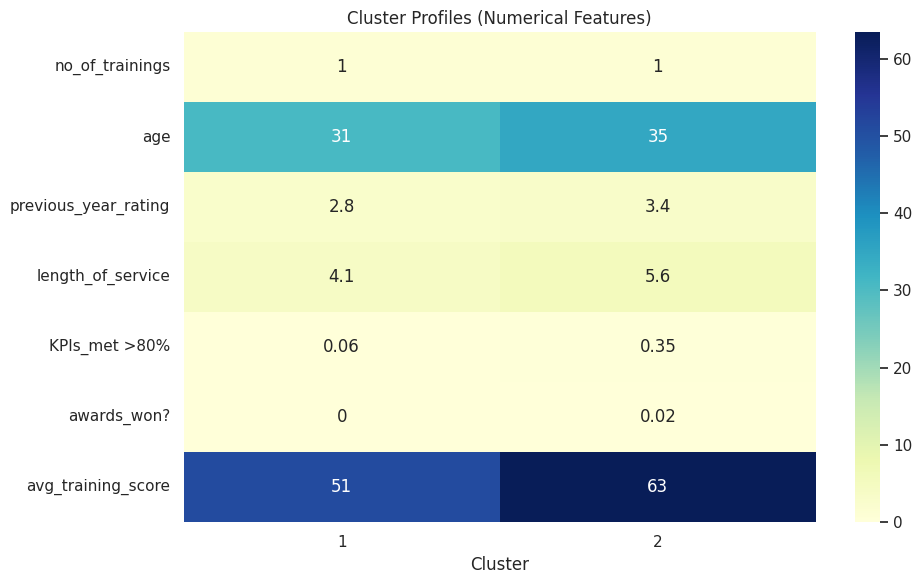

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Radar plot or heatmap to show differences
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_summary.T, annot=True, cmap='YlGnBu')
plt.title('Cluster Profiles (Numerical Features)')
plt.tight_layout()
plt.show()


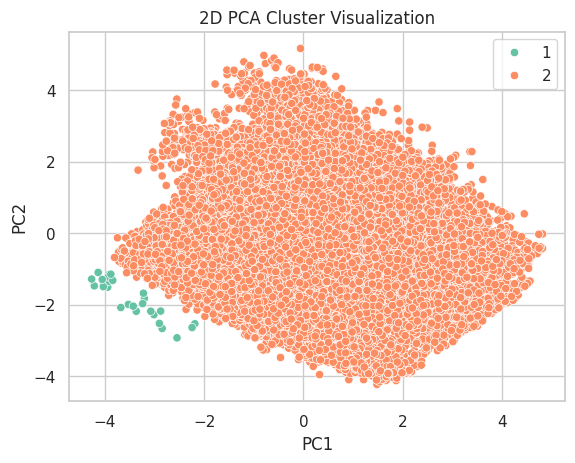

In [ ]:
import seaborn as sns
sns.scatterplot(x=hr_pca_sample['PC1'], y=hr_pca_sample['PC2'], hue=final_labels, palette='Set2')
plt.title("2D PCA Cluster Visualization")
plt.show()


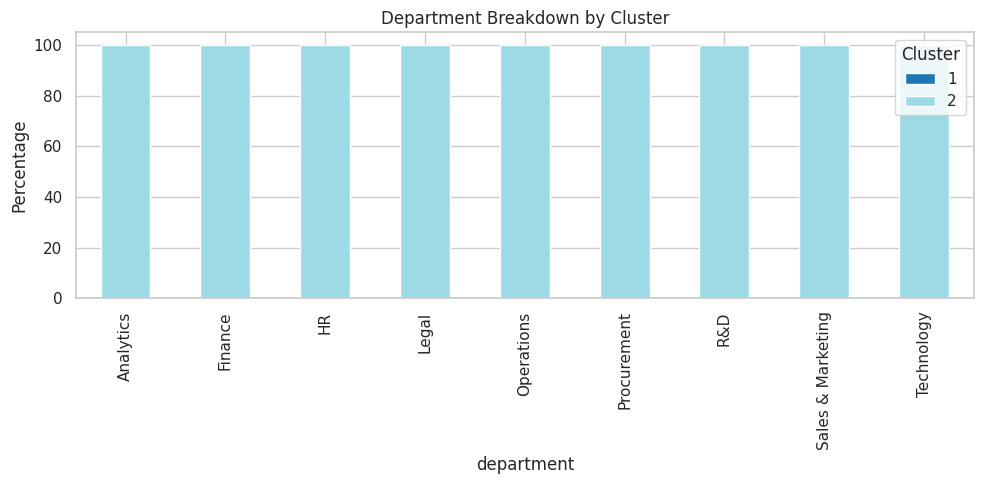

In [ ]:
# Example for 'department'
import pandas as pd

ct = pd.crosstab(hr_clustered['department'], hr_clustered['Cluster'], normalize='index') * 100
ct.plot(kind='bar', stacked=True, figsize=(10, 5), colormap='tab20')
plt.ylabel('Percentage')
plt.title('Department Breakdown by Cluster')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


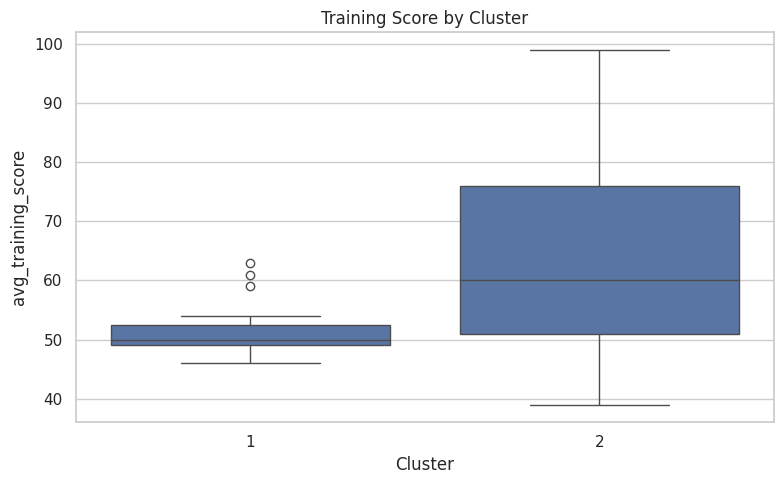

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=summary, x='Cluster', y='avg_training_score')
plt.title('Training Score by Cluster')
plt.tight_layout()
plt.show()


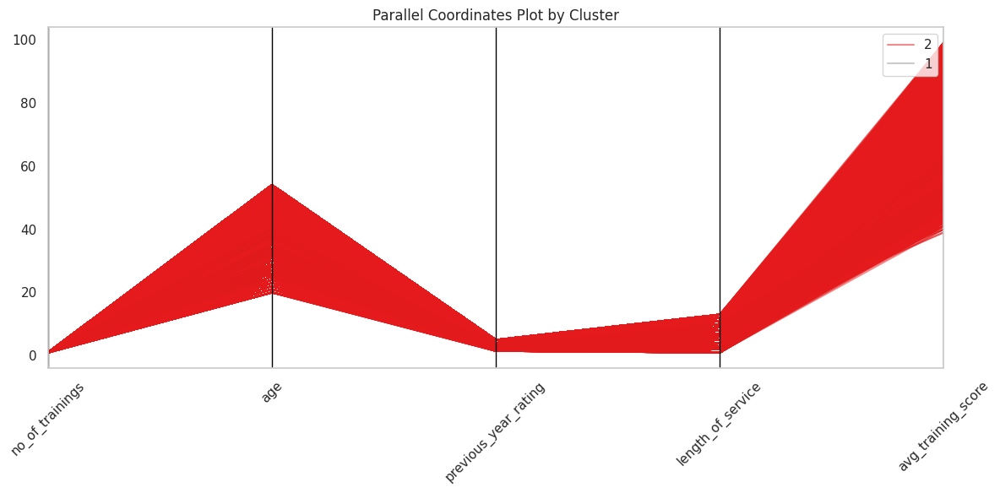

In [ ]:
from pandas.plotting import parallel_coordinates

selected_cols = ['no_of_trainings', 'age', 'previous_year_rating', 'length_of_service', 'avg_training_score', 'Cluster']
subset = hr_clustered[selected_cols].copy()
subset['Cluster'] = subset['Cluster'].astype(str)  # required for plotting

plt.figure(figsize=(12, 6))
parallel_coordinates(subset, 'Cluster', colormap=plt.get_cmap("Set1"), alpha=0.5)
plt.title('Parallel Coordinates Plot by Cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/tmp/ipython-input-1614555045.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=hr_clustered, x='Cluster', y=feat, palette='Pastel1')


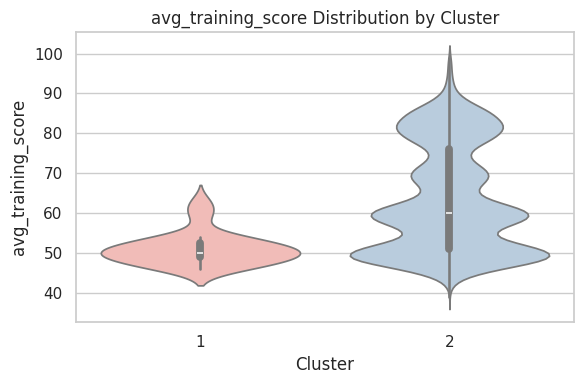

/tmp/ipython-input-1614555045.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=hr_clustered, x='Cluster', y=feat, palette='Pastel1')


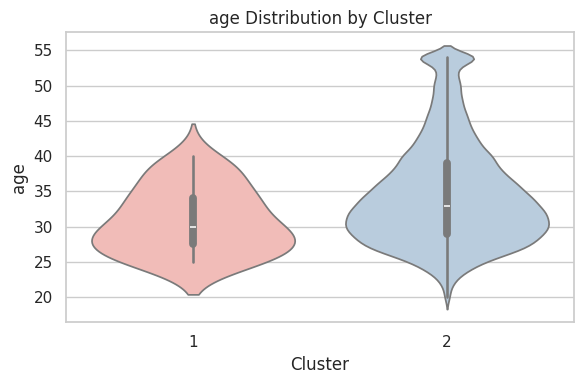

/tmp/ipython-input-1614555045.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=hr_clustered, x='Cluster', y=feat, palette='Pastel1')


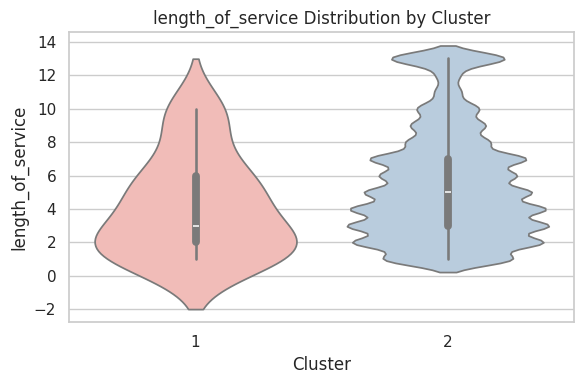

In [ ]:
for feat in ['avg_training_score', 'age', 'length_of_service']:
    plt.figure(figsize=(6, 4))
    sns.violinplot(data=hr_clustered, x='Cluster', y=feat, palette='Pastel1')
    plt.title(f'{feat} Distribution by Cluster')
    plt.tight_layout()
    plt.show()


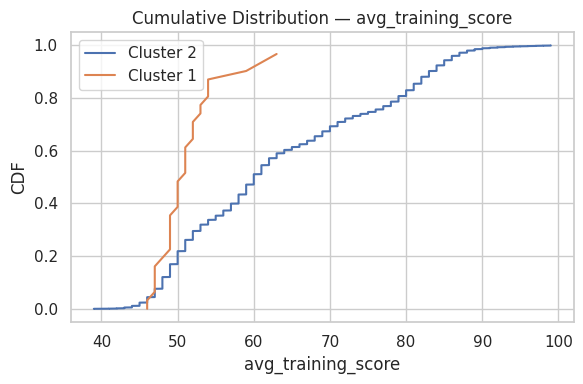

In [ ]:
def plot_cdf(feature):
    plt.figure(figsize=(6, 4))
    for cluster in hr_clustered['Cluster'].unique():
        subset = hr_clustered[hr_clustered['Cluster'] == cluster]
        sorted_vals = np.sort(subset[feature])
        cdf = np.arange(len(sorted_vals)) / len(sorted_vals)
        plt.plot(sorted_vals, cdf, label=f'Cluster {cluster}')

    plt.title(f'Cumulative Distribution — {feature}')
    plt.xlabel(feature)
    plt.ylabel('CDF')
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_cdf('avg_training_score')


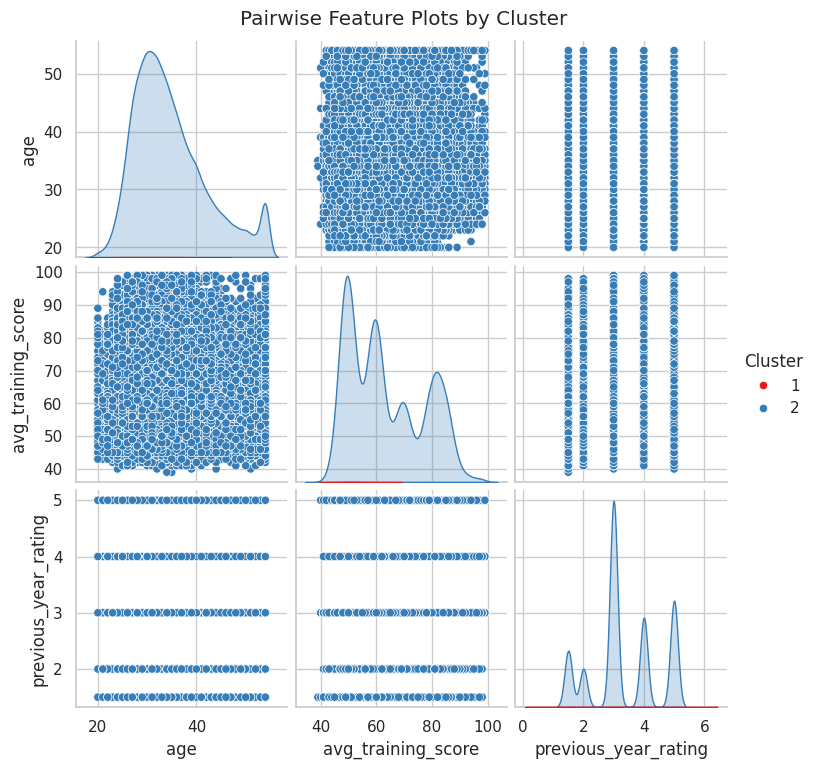

In [ ]:
sns.pairplot(hr_clustered[['age', 'avg_training_score', 'previous_year_rating', 'Cluster']], hue='Cluster', palette='Set1')
plt.suptitle('Pairwise Feature Plots by Cluster', y=1.02)
plt.show()


# 2.5 Summarise and Interpret

K Means Method

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)  # if too wide
display(cluster_summary.round(2))  # optional: round for readability



,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
Cluster,,,,,,,
0,1.0,30.63,3.45,3.87,0.43,0.03,72.25
1,1.0,42.29,3.54,8.64,0.36,0.02,65.25
2,1.0,33.18,3.08,5.00,0.24,0.02,50.25


Dendrogram Method

In [ ]:
numeric_summary = hr_clustered.groupby('Cluster').mean(numeric_only=True).round(2)
display(numeric_summary)


,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
Cluster,,,,,,,
1,1.0,30.84,2.76,4.13,0.06,0.00,51.10
2,1.0,34.72,3.36,5.57,0.35,0.02,63.39


# Machine Learning Assignment Report

# Summary/Overview

This assignment consists of two different tasks, with both having very different objectives. The first task involves predicting Airbnb rental prices (supervised regression) and uncovering patterns in human resources data through clustering (unsupervised learning). The main objective is to turn raw and messy data into actionable insight by building robust predictive models and interpretable segmentations.

The objective of Task 1 of the project is to estimate listing prices given the property and contextual features. The raw dataset contains numerical variables as well as categorical columns. To start off, we proceed with careful preprocessing. This is where we remove unnecessary columns, handle missing values, encode categorical columns, split data to prevent data leakage, remove outliers, and scale numeric features. We then created different types of baseline models, such as Random Forest regressors and Linear regressors. They are then tuned using methods like GridSearch to find the best hyperparameters. We evaluate the model with different metrics like R², MAE (Mean Average Error), and RMSE (Root Mean Squared Error), specifically RMSE.

The objective of Task 2 of the project is to segment employees based on their behavioral and performance indicators, enabling targeted human capital strategies. After preprocessing, such as handling categorical variables, standardizing scales, and ensuring irrelevant columns are dropped, we then explore K-means and hierarchical clustering methods. The optimal number of clusters is determined using different validation methods such as silhouette score and elbow method. Dimensionality reduction (e.g., PCA) is also used for visualization, making the high-dimensional structure more interpretable. Clusters are then profiled to assign human-readable labels (e.g., low KPI achievers) to obtain actionable insights for HR intervention like training allocation or retention focus.

Together, these tasks closely follow the universal machine learning workflow. From problem framing, data exploration to transformation, modeling, validation, and interpretation. The price prediction model supports operational pricing decisions and fairness checks, while the clustering reveals groups that traditional reporting might miss. These tasks show how supervised and unsupervised techniques can help estimate predictions and structure understanding respectively.

# Task 1: Airbnb (Rental price prediction)

## Problem Understanding

For this assignment, we are to create a model that is able to predict and estimate the daily rental prices of the Airbnb dataset. This price estimation is critical for different stakeholders. First would be hosts who need guidance on how to set competitive yet profitable rates. Second would be guests who benefit from transparent and fair pricing to make sure they get what they pay for. Lastly is the Airbnb platform itself, which can make use of these pricing insights to help balance supply and demand of listings to enhance overall booking efficiency. This is a supervised regression problem with price (in dollars) as the target variable.

There are a few challenges that occurred while working with the Airbnb dataset. Firstly, the prices are heavily right-skewed, with a few outlier listings with extremely high prices. This could disproportionately influence training and metrics if left unaddressed. Hence, to try and counter this, I applied a log transformation to price during training so that it would learn more stably. The predictions are then transformed back to price with the inverse log transformation for evaluation. This reduced the impact of the severe outliers and helped it generalize better. Especially since the order of the data cleaning matters—one misorder and it would have caused data leakage. For example, I originally tried feature engineering of price per night but that caused data leakage.

## Approach
My approach was to make use of the universal machine learning workflow, CRISP-DM. We identified this problem as a supervised regression task with price being the target variable column. We would measure success by minimizing prediction errors with metrics like R², RMSE (root mean squared error), and MAE (mean absolute error). Evaluation was done with a hold-out validation set.

## Data Exploration

To create this model we had to better understand and explore the dataset. It helped us see the structure, outliers, and missing values of the dataset. From our findings, we could see that it had 16 columns with a mix of datatypes (float64, int64, and object). The columns last_review and reviews_per_month had 2,758 missing entries while name had 2 missing entries. It had a shape of 7,907 × 16.

We could also see that the max value of price was 10,000 while its 75th percentile was 199. With further investigation by plotting price values, it also showed that the price column is very right skewed. For the categorical columns, neighbourhood_group had 5 different unique values and “Central Region” was most frequent. neighbourhood had a high cardinality with 43 unique values while room_type had 3, with “Entire home/apt” and “Private room” dominating. These proportions were examined to understand class imbalances and rarity.

There were also many numerical features visualized with boxplots for further investigation. Features like minimum_nights, number_of_reviews, and reviews_per_month also had long tails and potential outliers. For example, some listings had minimum_nights of 1,000 and number_of_reviews as 300.

## Data Cleansing and Transformation

This data preprocessing method was designed in a sequence of steps to ensure no data leakage and consistent application to training and testing data. It also kept explicit versions of both the raw and transformed price target.



### Dropping Columns


Firstly, irrelevant or unrelated columns that do not contribute to price prediction were dropped such as id, name, host_name, and last_review. This is to prevent unnecessary additional complexity or noise. id is a unique identifier, name and host_name are high cardinality fields, and last_review is a timestamp used for review recency. These columns are removed to reduce dimensionality and prevent risks of unintended leakage or overfitting.

### Missing Values Imputation



The 2758 missing values in ‘reviews_per_month’ had been imputed with zero. We assumed that the missing reviews implies that there were no reviews in that period. This imputation is important since most machine learning models cannot handle missing values directly. This would help preserve the dataset’s integrity.

### Filter


Listings with excessively long minimum stay requirements were constrained by filtering minimum_nights ≤ 365 to exclude extreme outliers. This helps improve generalization and reflects typical short-to-mid-term rental behavior.

### Log Transformation


Since price distribution was heavily right skewed, we applied a log transformation to the target. This makes the distribution more symmetric, allowing the model to learn patterns more effectively and improve prediction accuracy. Both the raw price (y_raw) and log-transformed price (y_log) were maintained so that the models could be trained on either scale for comparison. The ones trained on the log scale were then inversely transformed back to dollars for consistent evaluation.

### One-Hot Encoding


The categorical variables were converted into dummy variables with one-hot encoding; the original columns were dropped. The categorical variables encoded were room_type, neighbourhood, and neighbourhood_group. This helps the machine learning model recognize the different categories.

### Train Test Split

The data was split into training and test sets, 80% and 20% respectively, before any statistical transformations were applied to prevent information leakage. This is crucial so that the model is evaluated on completely unseen data. Otherwise, it would have been tested on data it was already trained on, making the results unreliable and biased.

### Remove Outliers




From the training set, outliers in the target column, price, were handled by computing the 5th and 95th percentile bounds on the raw price and retain only examples within that range. This filters out the training examples with extreme price values. The test set was kept as it is to ensure unbiased evaluation, preserving the natural distribution.
This helps to improve model accuracy by reducing the influence of extreme values that can skew learning. The outliers could distort relationships between features and the target variable which would lead to poor generalization.

### Scaling



Finally, the numeric features were normalized using a quantile transformer, which helps to normalize the values. This was only fit on the training data to prevent leakage. This reduces skew and makes numeric inputs more comparable, helping models that benefit from regular distributions.

This cleaned, encoded, and scaled feature matrix, along with raw/log targets, served as inputs to the baseline and tuned regression models.

## Correlation Analysis

To further explore and understand the relationships between numerical features and the target variable (price), I had created a correlation heatmap after basic data cleaning. This includes dropping irrelevant columns and imputing missing values to ensure reliable analysis.

From this heatmap, we could observe that most features had weak linear correlations with price. Especially latitude and longitude which has a negative correlation. Surprisingly, features like number_of_reviews, reviews_per_months and minimum_nights had very low correlation with price, showing that engagement does not directly drive pricing.

However, there is a strong positive correlation between number_of_reviews and reviews_per_months (0.67). This is expected due to their conceptual relationship. But this correlation analysis helped me to confirm that no features had significant multicollinearity issues, allowing me to proceed with slightly more data preprocessing steps and modelling.



## Modeling

**Baseline Models**

I had experimented and built a variety of baseline regressors to establish as a reference. I build models on random forest regressors, decision tree regressor, linear regression, gradient boosting regressor , support vector regressor and XGBoost regressor. For each of the models, I have trained and tested it on both the raw price and the log price for comparison.

For my models, I had chosen RMSE to be the metrics for evaluation. It is preferred when large errors are undesirable since it penalizes them more than MAE. It shows how the model is able to predict on average, seeing the difference from actual values. This is very easy for interpretation


**Random Forest Regressor**

It is an ensemble of decision trees that averages multiple bootstrap-sampled trees to reduce variance and improve generalization.
My random forest regressor baseline model had performed well on both raw and log price. On raw price, it had a train RMSE of 17.65 and test RMSE of 46.36. On the log price, it had a train RMSE of 20.20 and test RMSE of 45.93. This is one of the best performing baseline models I have, especially the one trained on raw price.

**Decision Tree Regressor**

It is a single tree that constantly splits the feature space to fit constant predictions.
 My decision tree regressor baseline model had performed decently on raw and log price. It has a test RMSE of 61.43 for raw price and test RMSE of 64.13 for log price.

**Linear Regression**

It fits a straight-line (linear) relationship between input features and the target by minimizing squared error.
 My linear regression models have performed well on both raw and log price. It has a train RMSE of 61.24 and test RMSE of 59.33 on raw price, and train RMSE of 62.55 and test RMSE of 61.44 on log price.

**Support Vector Regressor (SVR)**

It finds a regression function that fits within a margin (epsilon) while penalizing deviations, potentially using kernels for nonlinearity.
 Support Vector Regressor performed badly on both raw and log price. It has an RMSE of 82.29 for train (raw) and 80.54 (raw) for test. It has an RMSE of 82.28 for train and 80.24 for test for log price.

**XGBoost Regressor**

It is a gradient-boosted ensemble of weak trees with regularization and optimized shrinkage to sequentially correct residuals.
 XGBoost regressor performed well on both raw and log price. It has an RMSE of 22.81 for train (raw) and 48.30 for test (raw). For log price, it has an RMSE of 27.12 (train) and 47.27 (test).


**AdaBoost Regressor**

It sequentially boosts weak learners by reweighting examples that previous learners got wrong to reduce bias.
 Lastly, AdaBoost performed decently. Its train RMSE is 66.25 (raw) and test RMSE is 66.71 (raw). On log price, it has a train RMSE of 62.76 and test RMSE of 60.71.


### Feature Importance


For the top performing baseline model, random forest regressor, feature importance was extracted. The top features include room_type_Private room, latitude and longitude and availability_365. This aligns with domain intuition, where location and property heavily influences prices, followed by availability.

## Improving model’s performance


Using a voting regressor, I had made used of my top 3 baseline models. The voting regressor combines predictions from multiple individual regression models to improve overall accuracy. It takes the average of their predicted values, reducing the impact of errors made by individual models. By using the strengths of different models, it often yields more accurate and stable predictions than any single model alone.
As shown in the results, it was able to drop the best test RMSE of 45.93 to 45.36, allowing for a decrease of almost 0.60.



Next, I had tried to use a stacking regressor for the same 3 best performing baseline models. It combines multiple base regressors and uses a meta-model (e.g Linear Regression) to learn how best to combine their predictions. Unlike voting which uses average, stacking lets the meta-model learn patterns in the base models' predictions. This could potentially improve performance by capturing complex relationships.
It has a good test RMSE of 45.47 , dropping from 45.93 to 45.57 is a decrease of almost 0.40.



Next, I tried to improve the baseline models individually. And to do that, I used GridSearch to find the best parameters of each model.
For my ‘improved’ XGBoost model , where i adjusted the parameters to the best parameters found by GridSearch, it decreased my RMSE. The test RMSE of 47.27 dropped to 46.30, which is a 0.63 decrease.



I had performed GridSearch on the random forest model as well, on both the model trained on raw price and log price. With the adjusted parameters, the models that we supposed to improve had actually increased in RMSE. The one trained on raw price had increased from 45.93 to 46.54. While the one trained on log price had increased from 46.36 to 47.00. It is likely due to the tuned parameters prioritizing minimizing training error but not test error. Or it could have been that the GridSearch had overfit the cross-validation folds.



With our newly tuned models, I had redid voting regression. I performed it with the best models, including baseline models, that have the lowest RMSE. As of now, it is the baseline random forest (raw price), baseline random forest (log price) and the tuned XGBoost.
It has a test RMSE of 45.39.  It performed relatively better than our best baseline model but the original voting regression still slightly outperforms by 0.03.



I also retried the stacking regressor, once again with the best models as of now (same as the one above). It did improve from the previous stacking regressor from 45.62 to 45.47, but the original voting regressor still outperforms.



Based on the results, we have concluded that the voting regressor, with the original top 3 baseline models, still performed the best with $45.36 test RMSE. However it could be further improved by introducing spatial features or going beyond and using more advanced ensemble blending (e.g weighted voting) or optimization based on validation performance.

In conclusion, the building of the price prediction model was designed to ensure data integrity. We ensure it is kept with no leakage, handle skewed targets via log transformation, and evaluate a diversity of models with tuning. The final tuned model with the best performance is the voting regressor of the 3 baseline models. It has a test RMSE of $45.47 and R^2 of 0.6834, showing decent and above average performance. Future iterations could tighten generalization gaps through better encoding, additional derived features or semi-supervised strategies.


# Task 2: HR Analytics (Promotion prediction)

## Problem Understanding


Employee promotion decisions are critical decisions to be made by the Human Resource (HR) departments. They would have to identify the right individuals for upward movement which ensures employee retention, rewarding high performance and aligns workforce development with business goals.

The traditional methods of determining promotion often heavily rely on supervisors’ evaluation or rigid policy guidelines. However, with data becoming more readily available in HR systems, a more data-driven and objective approach can be used to support these decisions.

In task 2 of our assignment, instead of using a supervised classification models that rely on labeled promotion data, we adopt an unsupervised machine learning approach known as clustering. Clustering helps us to understand the underlying structure in the data, uncovering natural groups of employees solely based on their attributes and characteristics. This method would help to avoid human bias from previous promotion decisions and would focus on observable behavioural and performance patterns.

By clustering employees into groups based on numerical data like age, training score. Past performance and experience, we can identify key employee profiles. This will help us better understand their characteristics and provide meaningful insights to HR teams for promotion consideration.


## Data Exploration

To start building our models, we would have to understand our dataset to know what we are working with. Therefore data exploration is crucial.
The original HR_data.csv dataset contains 548008 employee records and various different features. They have data of personal columns (e.g ‘age, ‘gender’ ,’education’ ,’region’), work-related columns (e.g ‘department’ , ‘length_of_service’ , ‘recruitment_channel’ , ‘is_promoted’ ) and performance-based columns (e.g ‘previous_year_rating’, ‘avg_training_score’ ,’KPIs_met >80%’ , ‘awards_won?’, ‘no_of_trainings’).

Columns like ‘previous_year_rating’ and ‘education’ have many missing rows of 4124 and 2409 respectively. There is also a large number of employees in the sales&marketing department compared to departments like Legal or R&D. The age distribution of the employees are also right skewed as well as the length of service. Majority of the employees are in region 2, with most of them being males and have a bachelor’s degree. Most employees did not meet their KPI goal of above 80% and did not win any awards.


## Data Preprocessing

Now that we have an idea of what our dataset has, we can proceed to clean our data for further modeling.

### Missing Values



First we impute the missing values. This step is crucial as it helps to prevent the introduction of bias or errors during clustering. The 4124 rows of ‘previous_year_rating’ were being filled with its column’s median. Since this columns represents a rating score, we chose median as it is less sensitive to outliers compared to mean, making it more appropriate for skewed distributions or when the ratings are not symmetrically distributed.

The 2409 missing rows of ‘education’ were filled with its column’s mode. This column has categorical values like ‘Bachelor’s’, ‘Master’s’ and ‘Below Secondary, calculating a mean for this column is not applicable. Instead, we filled the missing values with the mode, which is the most frequent education level in the dataset. This is a common and reasonable choice for imputing categorical variables since it preserves most of the original values in the distribution without introducing assumptions.

Removing missing values helps to ensure the dataset is usable for clustering or other modeling techniques without dropping rows or having invalid/biased data.


### Outliers




To help handle the outliers for clustering, I used the interquartile Range (IQR) method on all major numerical features, including training count, age, and average training score. For each feature, the values below Q1 − 1.5 × IQR and above Q3 + 1.5 × IQR were considered potential outliers. And instead of removing these records, we clipped them to the respective bounds. This helps to preserve the row ,reduce extreme influence , retain data integrity while minimizing skewness and improving the reliability of distance-based clustering results.


### Dropping Columns


We removed certain columns that would not contribute meaningfully to our clustering task.
Firstly, would be the employee id column. It serves solely as a unique identifier for each employee and does not carry any relevant information about employee behavior, performance or characteristics that can help distinguish clusters. Including it in would introduce unnecessary noise as the model would try to form patterns around these arbitrary id values with no significance. Hence it was dropped from the data set.

Secondly, even though ‘is_promoted; is a valuable column in supervised learning tasks like classification, it is not needed for clustering, which is an unsupervised learning approach where we uncover natural groups in the dataset without labels. Including ‘is_promoted’ may bias the clustering process towards known outcomes which defeats the purpose of unsupervised exploration. Instead, we can use ‘s_promoted’ after clustering to analyze whether promotion rates vary across different clusters.


### Encoding



We used one-hot encoding to convert the categorical and non-numerical fields like department, gender and recruitment channel into binary columns for the model to understand the different categories.


### Scaling



We used a standard scaler  to standardize all of the features. It helps to center the data around the mean and scales it by standard deviation. The normalization of the data helps to create a consistent scale and prevents features with larger numerical ranges from disproportionately influencing distance-based clustering methods.


### Principal Component Analysis (PCA)



Before building the models, we performed dimensionality reduction using Principal Component Analysis (PCA). This helps to reduce the dataset’s features into a smaller set of linearly uncorrelated components while preserving most of the variance. For each of the models, I experimented with the different numbers of principal components. This would reduce the noise while simplifying the structure of the data, improving clustering performance.


All these steps helped to prepare the dataset for robust and interpretable clustering.

## Building of Models

### K-Means Clustering


First, we tried to apply K-means clustering which is a popular partitioning algorithm that aims to group data points into k distinct non-overlapping clusters. It aims to minimize intra-cluster variance and it is efficient with large datasets, making it a reasonable starting point for our unsupervised learning task.


**Elbow Method**

To determine the optimal number of clusters, k, I used the elbow method as one of the evaluation techniques. This involved plotting the inertia (sum of square error within the cluster) against the different values of k. We looked for the ‘elbow point’ which is the bend in the curve and where the decrease in inertia starts to level off. The elbow appeared around k=3, suggesting that adding more clusters beyond this point is likely to yield diminishing returns in terms of the explained variance.


**Silhouette Score Method**

This method helps to measure how well each data point fits within its assigned clusters as compared to other clusters. The silhouette score has a range of -1 to 1, where a higher silhouette score indicates better defined clusters. The optimal number of k obtained from this method is by seeing at which k-value the silhouette score peaks



**K-Means Clustering Combined**

I had tried experimenting with a different number of principal components of PCA for k-mean clustering. The goal was to determine whether retaining a fixed number of components would produce more meaningful clusters.

The first value we tried were 3 components to simplify the feature space for efficient clustering and better visualisation. This captures less variance but focuses on the directions of highest variance. The elbow is at k=3 with an inertia of 175000 and the silhouette score peaks with a score of around 0.32 at k=4. While k=4 had the best silhouette score, the clusters were not highly distinct, showing that the data may not be strongly separable in just 3 dimensions.I was not very satisfied hence I continued to experiment further.



The second value I tried was 0.95 components, retaining 95% of the total variance , more than with 3 components.. The plot of the elbow method, inertia against k, shows a gradual decline with no distinct elbow point. While k=3 was initially considered, the curve lacks a clear inflection, suggesting no strong and tight natural clustering. As for the plot of the silhouette score against k clusters, the silhouette scores (0.1-0.2) remained consistently low across all values of k. Its peak was around 0.21 at k=2, indicating a weak structure.
With more retained variance, the increased dimensionality may have introduced more noise, making it harder for k-mean to define the strong boundaries.




Lastly, I tried a simpler configuration using only 2 principal components for minimal dimensionality while clean visualisation. The plot of the elbow method of inertia against k, shows that there is a clear bend at k=3, where the inertia dropped from around 150000 to 90000. The plot of the silhouette score against the k number of clusters, shows that the silhouette score peaked at 0.41 at k=3. It is the highest silhouette score obtained from k-means clustering so far and it uses the simplest configuration, retaining the least variance. The dominant features captured by the first 2 components were enough to reveal the underlying structure in the data.

### K-Means Results

Hence with the experimentation with K-Means clustering, it is evident from the elbow method and silhouette score that k number of clusters is 3  with 2 principal components and peak silhouette score of 0.41, with the best separation and cohesion overall.




There were 3 clusters formed from this method.

Cluster 0 shows young and highly trained performers. It has a mean age of 30.6 years old, which is the youngest group, with length of service of 3.9 (shortest group) and highest training score of 72.3. It also has the highest KPIs met >80% of 43.5% and 3.3% awards won. Their awards won is 3.3% (highest) and had a previous year rating of 3.45 (moderate).
This group consists of younger employees with shorter service length but high and strong performance. They are early-career high potential individuals. Their investment in training pays off in performance, making them strong candidates for development and promotion.



Cluster 1 shows experienced and stable contributors. It is the oldest group with a mean age of 42.3. They have the longest length of service of 8.6 years, highest previous year rating of 3.54. Their training score is moderate with 65.25 , KPIs met >80% of 35.98 and awards won of 1.7%.
This group consists of senior employees with long service and the best performance ratings, though their training scores and award rates are moderate. They are likely experienced, stable contributors who rely more on accumulated experience instead of training.



Cluster 2 shows the underperforming newcomers. It has a mean age of 33.2 years old and length of service of 5 years. However, they have the lowest previous year rating (3.08), average training score (50.25) and KPIs met >80% (23.8%). Their awards won was 1.6%.
This group shows the lowest performance, training outcomes and KPI achievement, Despite being middle-aged with moderate service, their low engagement in training and weaker performance suggests that they may require support or intervention.



I had also plotted a 2D PCA scatter plot with k=3 to visualise the clustering results. It shows the distinct group, showing that k-means was able to identify meaningful boundaries in the PCA-reduced space. The green cluster shows cluster 0, the rising performers, the orange shows cluster 1, the veteran performers, and blue shows cluster 2, the employees at risk.
There is a clear separation with minimal overlap, especially along PC1.


### Hierarchical Clustering

To explore other alternative grouping methods other than K-Means, we applied hierarchical clustering. It builds a tree-like structure of nested clusters , like a dendrogram, without requiring a predefined number of clusters. This method is very useful for identifying natural grouping with varying sizes and shapes.

**Dendrogram**

We performed agglomerative clustering on the PCA reduced data set, with 0.95 components, to retain 95% of the original variance while reducing dimensionality. After applying PCA, we then perform agglomerative clustering.

For this method, I had used the original dataset without sampling to ensure full representation of the dataset, ensuring integrity. The threshold for cutting the dendrogram was selected using the largest distance gap in the linkage matrix.

For my first cluster, I had tried to use the ward linkage method where it minimizes the variance within clusters. The automatically selected threshold was around 229.4 with a silhouette score of 0.3603. This dendrogram shows a well-separated branching structure with moderately cohesive subgroups. This silhouette score suggests reasonable cluster compactness. But I wanted to further explore for a higher silhouette score.

Hence for my second cluster, I used complete linkage method instead, with the same number of principal components. The automatically selected threshold was much lower of 34.35 and it is shown to yield the highest silhouette score of 0.7772. This dendrogram reveals 2 major groupings with very high separation. The high silhouette score indicates excellent cluster cohesion and separation, suggesting that k=2 is the most optimal number of clusters for this method.



**Silhouette Method**

As an additional silhouette evaluation, we tested hierarchical clustering with varying k value from 2 to 10, to observe silhouette score behaviour. The silhouette consistently dropped as the number of clusters increased, hence further emphasising that k=2 is the best balance of separation and cohesion. This trend was observed across multiple linkage methods such as complete,average and centroid.

Overall, this hierarchical clustering using complete linkage had produced the best silhouette score of 0.7772 of all clustering models tested, significantly outperforming the K-means model with a peak of 0.41 silhouette score.


### Hierarchical Clusteting Results

After much exploration with visualisations and investigation, we have come up with the interpretations of the 2 clusters, which is the optimal number of clusters. They were analyzed by examining the average values of key HR attributes from the original dataset.


For the first cluster, cluster 1 shows the group of at-risk or developing employees. They have a lower mean average training score of 51.10 and lower KPIs Met >80% of 0.06, much lower than  cluster 2. They also have a lower previous year rating, with a mean of  0 awards won. They are slightly younger (30.84) with shorter length of service.


These are the underperforming and less engaged employees who score lower on most performance metrics. They may require target support or training and may be at risk of stagnation. They may benefit from more training or targeted mentoring.


Contradictory, cluster 2 shows the engaged high performing employees. They have a higher mean average training score of 63.39 and higher KPIs Met >80% of 0.36. They also have a slightly higher previous year rating, with a mean of  0.02 awards won. They are slightly older (34.72) with a longer length of service of 5.57.

This group of employees are the well performing and engaged employees who demonstrate strong results in KPIs, training and past reviews. They are likely the main contributors in the organization and may be considered for performance based rewards.



# Summary and Further Improvements

## Summary of Findings

This assignment involved two distinct yet complementary machine learning tasks. The first task being the supervised regression for predicting Airbnb rental prices and the second task is the unsupervised clustering to segment employees for promotion analysis. Both tasks required data exploration and preprocessing, thoughtful modeling and performance evaluation to convert hte raw data into actionable insights.


### Task 1

The goal of task 1 was to estimate listing prices using various property and contextual features. This regression problem highlighted how crucial and important structured preprocessing is, especially with the challenges in the dataset like missing values and skewed distributions.

Through extensive data cleaning of the airbnb dataset, we had removed irrelevant columns, handled missing values, transformed skewed values, encoded categorical variables, scaled numerical values and ensured there is no data leakage with the train test split.

Then, a variety of regression models were tested, such as linear regression, random forest, XGBoost, decision trees, SVR, and AdaBoost. Among all of the baseline models, random forest trained on raw prices performed the best with a test RMSE of $45.93.

To further improve and tune the performance, ensemble methods like voting regressor and stacking regressor were implemented. It combines the top-performing models and the best overall results was achieved with a voting regressor , which reduced the test RMSE to $45.36.
This demonstrated how important model ensembles and diverse base learners are for improving generalization. Feature importance analysis also revealed that location-related variables, such as latitude, longitude, and room type were the key drivers of price. These insights align well with real-world expectations in property pricing.



### Task 2

The goal of task 2 was to identify meaningful groups of employees based on performance and behavioral features using unsupervised learning.
The hr dataset underwent detailed cleaning. The cleaning includes imputation of missing values (median for numerical, mode for categorical), handling outliers, one-hot encoding , feature scaling and dimensionality reduction with PCA.
We began with K-Means clustering where we experiment with different PCA component configurations (2,3 and 0.95 components). We then made use of the elbow method and silhouette score method to find our best and optimal k value (number of clusters). After exploring, we found out that using 2 PCA components helped us to achieve the highest silhouette score of 0.41 at k=3.
We then investigated further to understand the 3 different clusters better. Cluster 0 consists of rising performers of young, highly trained and high KPI achievers. Cluster 1 consists of veteran performers who are older, experienced and consistently rated high. Lastly, Cluster 2 consists of at-risk employees who are mid-aged and  underperforming with low training/KPIs.


K-Means clustering is more interpretable but it is constrained but its assumption of spherical and equal-sized clusters. Hence we went further to apply hierarchical clustering.
Using hierarchical clustering with complete linkage helped us determine our optimal clusters of 2 with an outstanding silhouette score of 0.7772, outperforming k-means clustering. We had also tried different linkage methods but complete still proved to yield the best performance.
After much investigation of 2 different clusters, we came up with 2 interpretations. Cluster 1 consists of at-risk and developing employees who had low scores across all metrics, needing targeted intervention. On the other hand, cluster 2 shows engaged high performers with strong KPI performance, training engagement and previous year ratings.
This method of clustering had provided a clearer natural groupings and was better aligned with the structure of real-world HR data.


### Overall

Together, these clustering results provide a layered view. The finer three-group partition from K-means helps identify things rising talent versus veterans versus at-risk individuals, while hierarchical clustering offers a robust separation between high and low engagement/performance groups. These insights can guide HR interventions—such as targeted upskilling for at-risk groups, development paths for rising stars, and recognition for consistent contributors.


## Further Improvements

Although both of my models from the 2 tasks performed relatively well, there is still room for improvement with a lower RMSE for task1 and a higher silhouette score for task 2.

### Task 1

For task 1, the airbnb price predicting, there are a few suggestions and improvements that could be implemented to further enhance the model. Firstly, we could enhance our feature engineering. We could incorporate spatial features like distance to city or famous landmarks or use external data like holidays period to account for the high demand surges. Secondly, we could incorporate more advanced ensemble techniques like weighted voting instead of simple averaging. For example, gradient-boosted stacking with meta-learners like Ridge. We could also use K-fold cross validation instead of hold out validation for a more robust performance estimation.

### Task 2

For task 2, the HR clustering, there are also some possible suggestions to further improve the model. Firstly, we could incorporate categorical interpretations like seeing how the personal data (departments, gender and education) are distributed across clustors. Secondly, we could repeat clustering with bootstrap sampling to ensure stability. Lastly, we could map the clusters back to employee records for the HR teams , ready to deploy the model.

## Reflection

This assignment helped me to deepen my understanding of both supervised and unsupervised machine learning pipelines. Working through the hands-on exercise deepened my understanding of the class material, allowing me to relate what I am doing back to the theory I learnt. I developed hands-on proficiency in end-to-end data workflows, from cleaning raw data , building of models to model evaluation and interpretation.

This assignment really helped me to understand the importance of the data preprocessing order so as to prevent data leakage. I had tried multiple orders, ones where I had achieved a test RMSE of 9.21. However after much checking, I realised that I messed up the order which caused data leakage hence able to achieve such a low RMSE. Scaling is also very important for regression models, where using standard scaler and quantile transformer can achieve different results.

Another takeaway is how powerful ensemble models are compared to regular basic models. It helps to improve performance without complex modeling. For hierarchical clustering, i had also played around the PCA components and figured out that 0.95 was able to help me yield a good silhouette score. Showing that PCA and scaling heavily impact clustering outcomes. Unsupervised learning is a powerful method in extracting structure and insights even if the labels are absent.

I also was able to relate the metrics like RMSE and silhouette score to actual practical business insights like optimizing pricing strategies and identifying well performing employees.


## Use of Generative AI / Learning Assistants

Generative AI , tools like ChatGPT, has helped and assisted me with my assignment. It mainly helped me with checking my code. For example, I had a suspiciously low RMSE but I could not figure out why, hence I went to Chatgpt and found out there was a data leakage due to my concept error. From this, I learnt how to prevent data leakage and fixed my concept error. I used ChatGPT as I was able to obtain immediate feedback, something not always possible when contacting lecturers, especially if it is something trivial. However what ChatGPT says may not always be right. It is likely due to AI hallucination where they create outputs that are inaccurate. For example, when I first asked them about my code, they would say it seems fine, but when I further inquire and point out the errors, then they would agree that it is not fine.
